# Neogrowth model 

## Description

This the textbook neogrowth model with known (linear solution). Consider an agent maximizing her inter-temporal discounted utility
\begin{equation}
\begin{split}
\max_{\{c_t\}_{t=0}^{\infty}} E\Big[ \sum_{t=0}^{\infty} \beta^t u(c_t)\Big]
\end{split}
\end{equation}
with $y_0$ given. She enters period $t$ with income $y_t$ and chooses her consumption level $c_t$ subject to the constraints $0\leq c_t \leq y_t$. What is saved in the current period is used for production to generate income next period.

Income next period is stochastic and takes the following form: $y_{t+1} = g(y_t - c_t)\eta_{t+1}$ with $\eta$ denoting i.i.d. productivity shocks.

Let us assume that preferences can be represented by a logarithmic utility function $u(c)=\log(c)$, the production function is Cobb-Douglas $g(k) = k^\alpha$, the discount factor is positive but strictly less than one, $\beta \in (0,1)$, and that productivity shocks are lognormally distributed $\eta_{t} \equiv \eta(\nu_t) = \exp(\mu + \nu_t)$, with $\nu$ a standard Normal random variable.

Solving the model involves finding the value of parameter vector $\theta$ such that the consumption function $c(y|\theta)$ satisfies the Euler equation characterizing the model:

\begin{equation}\label{eq:Euler_sgm} 
\begin{split}
E_{\nu}\Big[ u'\Big(c(y |\theta) \Big) - \beta u'\Big(c \Big( g\big(y - c(y|\theta) \big)\eta(\nu)\Big| \theta \Big) g'\big(y - c(y|\theta)\big) \eta(\nu) \Big)  \Big] = 0
\end{split}
\end{equation}

The above equation can be written as $E_{\varepsilon}[f(s, \varepsilon)]$, with the state variable $s = y$, the shock variable $\varepsilon=\nu$, and the function 

$$f(s, \varepsilon) = u'\Big(c(s |\theta) \Big) - \beta u'\Big(c \Big( g\big(s - c(s|\theta) \big)\eta(\varepsilon)\Big| \theta \Big) g'\big(s - c(s|\theta)\big) \eta(\varepsilon) \Big) $$

It is easy to verify that the optimal behavior for the agent is to consume a fixed fraction of her cash on hand $y$. More specifically, the optimal consumption policy function is given by $c^{*}(y) = (1 - \alpha \beta) y$.

## The bc-MC Operator

Let's pretend we do not know the solution. We are approximating the decision function with a artificial neural network (ANN) $c(y) \approx c(y|\theta)$. The loss function for the ANN is:

$$\mathcal{L}(\theta) =  E_{s}\Big( E_{s}\Big( f(s, \varepsilon) \Big)^2 \Big) $$

Let's approximate the loss function with the bc-MC operator:

$$\mathcal{L}_{M,N}(\theta) = \frac{2}{MN(N-1)} \sum_{m=1}^{M} \sum_{1\leq i < j}^{n} f(s_m, \epsilon_{m}^{(i)})f(s_m, \epsilon_{m}^{(j)}) $$

where $\epsilon^{(k)}$ for $k=1, 2, ..., N$ are $N$ i.i.d shocks with the same distribution as $\epsilon$. These $N$ shocks are independent from each other.

This formula can be vectorized as follows:

$$ f' \Big(I_N \otimes U\Big). f $$

With:

- U an upper triangular matrix filled with 1, and zeroes on the diagonal
- $I_{N,N}$ the identity matrix $M \times M$
- f a $MN\times 1$ vector:

$$ \Big(f(s_1, \varepsilon^{1}_{1}), f(s_1, \varepsilon^{2}_{1}),  ..., f(s_2, \varepsilon^{1}_{2}), ... , f(s_m, \varepsilon^{N}_{m})\Big)$$

**Remark**: If you set $N=2$, you have

$$\mathcal{L}_{M,2}(\theta) = \frac{1}{M} \sum_{m=1}^{M} f(s_m, \epsilon_{m}^{(i)})f(s_m, \epsilon_{m}^{(j)}) $$

which is the all-in-one operator of Maliar et al (2021).

## Structure of this notebook

    0. Dependencies
        Load dependencies and set some parameters
    I. Time iteration
        Solve the model using the TI algorithm
    II. AIO and bc-MC
        Compare AIO and bc-MC for a single run and for a given level of uncertainty
    III. Optimal choice of hyperparameters M and N: low uncertainty
        When uncertainty is low, calculate the optimal M and N. Compare several choices of M and N across several runs
    IV. Optimal choice of hyperparameters M and N: high uncertainty
        When uncertainty is high, calculate the optimal M and N. Compare several choices of M and N across several runs


## 0. Dependencies

Load packages and define some options and parameters.

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
from matplotlib import cm #colormap
from matplotlib.ticker import LinearLocator
import matplotlib.ticker as mtick

import numpy as np
import pandas as pd
import quantecon as qe
from interpolation import interp
from quantecon.optimize import brentq
from numba import njit, float64
from numba.experimental import jitclass

import random
import scipy.stats
import chaospy  ## for quadrature (expectations)
from itertools import product
import os

import tensorflow as tf
import time
from math import sqrt
import seaborn as sns; sns.set()
from tqdm import tqdm as tqdm # tqdm is a nice library to visualize ongoing loops
import datetime
# followint lines are used for indicative typing
from typing import Tuple
class Vector: pass
from scipy.stats import norm

import torch
from torch import nn
from torch.utils.data import DataLoader
# To create copies of NN
import copy
# To use sparse kronecker product
from scipy import sparse
from torchcontrib.optim import SWA

import statsmodels.api as sm
import statsmodels.formula.api as smf

2023-07-31 13:34:16.301995: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory
2023-07-31 13:34:16.302013: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


In [2]:
# Display version of python currently used
!python3 --version

Python 3.8.10


In [3]:
# Display which version of packages I am using
!pip freeze > requirements.txt
!cat requirements.txt

absl-py==1.0.0
aiodns==3.0.0
aiohttp==3.8.3
aiosignal==1.2.0
alabaster==0.7.8
altair==5.0.0
appdirs==1.4.4
apturl==0.5.2
argon2-cffi==21.1.0
arviz==0.15.1
astunparse==1.6.3
async-generator==1.10
async-timeout==4.0.1
attrs==21.2.0
Babel==2.6.0
backcall==0.2.0
backports.zoneinfo==0.2.1
bcrypt==3.1.7
beautifulsoup4==4.8.2
bleach==4.1.0
blinker==1.4
bokeh==2.4.2
bottle==0.12.19
branca==0.4.2
Brlapi==0.7.0
Brotli==1.0.9
bs4==0.0.1
cached-property==1.5.1
cachetools==4.2.4
cattrs==1.9.0
cchardet==2.1.7
ccsm==0.9.14.1
certifi==2019.11.28
cffi==1.15.0
chaospy==4.3.8
chardet==3.0.4
charset-normalizer==2.0.7
chrome-gnome-shell==0.0.0
Click==7.0
click-plugins==1.1.1
cligj==0.7.2
cmake==3.21.4
colorama==0.4.3
command-not-found==0.3
compizconfig-python==0.9.14.1
conan==1.42.1
contourpy==1.0.7
corner==2.2.1
cryptography==2.8
cupshelpers==1.0
cycler==0.11.0
DateTime==4.3
dblatex===0.3.11py3
DBnomics==1.2.3
dbus-python==1.2.16
debugpy==1.5.1
decorator==5.1.0
defer==1.0.6
defusedxml==0.7.1
dell-recovery

In [4]:
# Import functions from notebook
%run functions_neogrowth_model.ipynb

In [5]:
seed_number = 1234
random.seed(seed_number) # For replicability reasons
print(random.random()) 

0.9664535356921388


In [6]:
# Plotting options
plot_scale = 1.25
plt.rcParams["figure.figsize"] = (plot_scale*16, plot_scale*9)
# Controlling fontsizes
SMALL_SIZE = 12
MEDIUM_SIZE = SMALL_SIZE + 2
BIGGER_SIZE =  SMALL_SIZE + 4
plt.rcParams['legend.fontsize'] = MEDIUM_SIZE

# Option when reading and saving output csv.file
read_from_csv = False
save_to_csv = True
linewidth_chosen = 2

In [7]:
current_wd = os.getcwd() 
output_folder = current_wd  + "/output/"
# Create folder if does not exist:
if not os.path.exists(output_folder):
    # If it doesn't exist, create it
    os.makedirs(output_folder)

## I. Time iteration

Solve the model using the Time Iteration algorithm

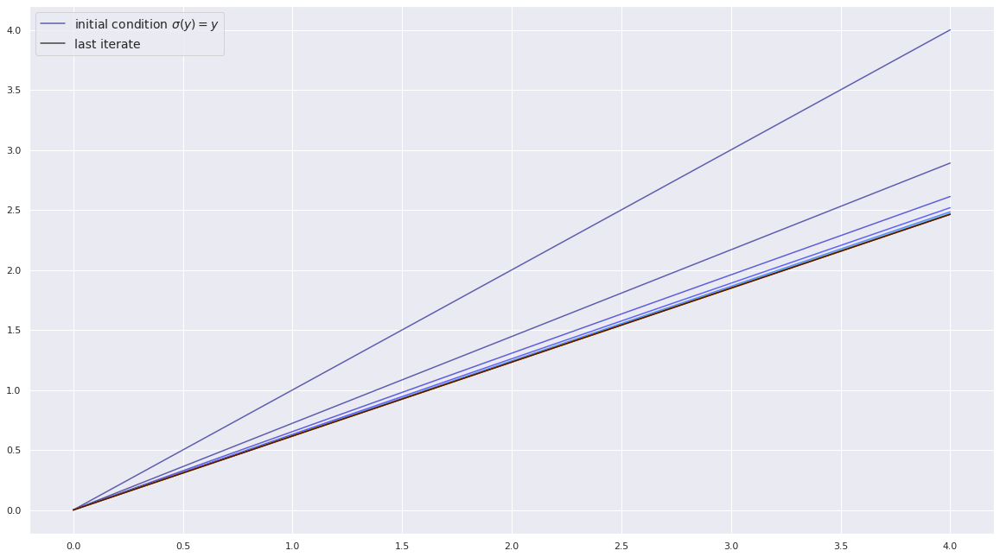

In [8]:
og = OptimalGrowthModel()
grid = og.grid

n = 15
σ = grid.copy()  # Set initial condition

fig, ax = plt.subplots()
lb = 'initial condition $\sigma(y) = y$'
ax.plot(grid, σ, color=plt.cm.jet(0), alpha=0.6, label=lb)

for i in range(n):
    σ = K(σ, og)
    ax.plot(grid, σ, color=plt.cm.jet(i / n), alpha=0.6)

# Update one more time and plot the last iterate in black
σ = K(σ, og)
ax.plot(grid, σ, color='k', alpha=0.8, label='last iterate')

ax.legend()

plt.show()

In [9]:
σ_init = np.copy(og.grid)
σ = solve_model_time_iter(og, σ_init)


Converged in 20 iterations.


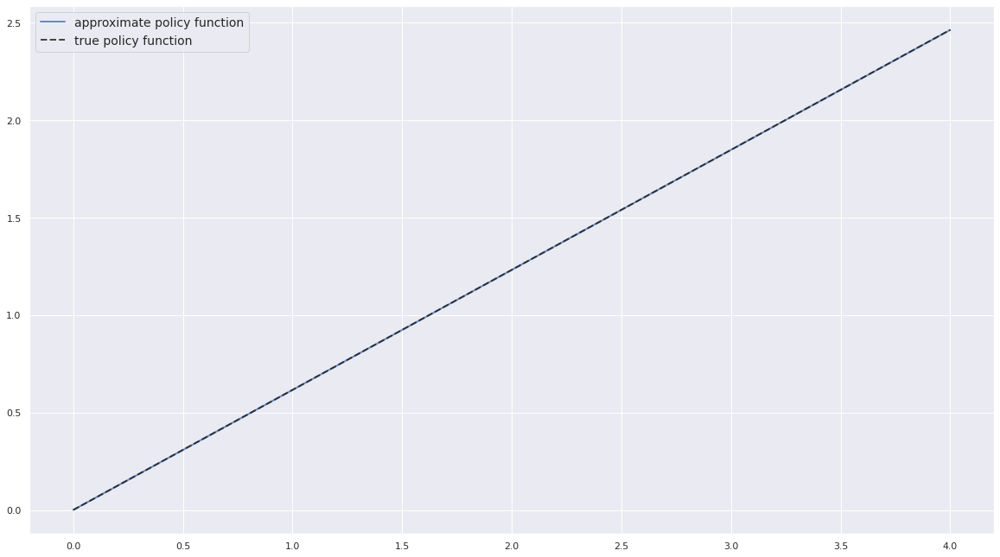

In [10]:
fig, ax = plt.subplots()

ax.plot(og.grid, σ, lw=2,
        alpha=0.8, label='approximate policy function')

ax.plot(og.grid, σ_star(og.grid, og.α, og.β), 'k--',
        lw=2, alpha=0.8, label='true policy function')

ax.legend()
plt.show()

## II. AIO and bc-MC

Compare **all-in-operator AIO (N=2)** and **bc-MC operator (N >= 2)** for a **single run** of gradient descent, and for a **given choice of $\sigma_{\nu}$**.

## II.A. All-in-One

You get the all-in-one expectation operator by setting $N=2$:

$$\mathcal{L}_2(\theta) = \frac{1}{T} \sum_{t=1}^{T} \Big( f(s_t,\epsilon_{1,t}|\theta) f(s_t,\epsilon_{2,t}|\theta) \Big) $$


In [11]:
#distrib = chaospy.J(chaospy.Normal(0, 1))
#nodes, weights = dist(1, distrib, rule = "gaussian", sp=True)
#nodes.shape

In [12]:
#W_test = create_W_expanded_matrix(2, 2)
#W_test.to_dense()

In [13]:
# Store parameters
class MyParams():
    def __init__(self, N, M, lr, pre_train_model, nb_epochs, order_gauss, σ_e, use_Sobol, optimizer):
        # OptimalGrowthModel
        self.α=0.4
        self.β = 0.96
        self.f = lambda k: k**self.α
        self.u = lambda c: np.log(c)
        self.f_prime = lambda k: self.α * (k**(self.α - 1))
        self.u_prime=  lambda c: 1/c
        self.u_prime_inv =  lambda c: 1/c
        # Standard error X (if drawing from Normal)
        σ_x = 1.0
        # If drawing from uniform
        x_low = 0.1
        x_high = 4.0
        # Standard shocks
        σ_e = σ_e # for large shocks, it is better to use MC, for small shock: all-in-one
        μ_e = 0.0 #location parameter shocks
        # Values passed as inputs
        self.N = N #number of draws inside expectation
        self.M = M #number of draws outside expecation
        self.MN = int(self.M*self.N)
        # To keep constant the number of function evaluations
        self.T = int(self.MN/2) #number of draws all in on expectation
        self.σ_x = σ_x
        self.x_distribution = "Uniform" #"Normal" #Uniform or Normal
        self.σ_e = σ_e
        self.μ_e = μ_e
        self.e_distribution = "Lognormal" #"Normal"
        self.x_low = x_low 
        self.x_high = x_high
        # Vectorized Monte Carlo requires the creation of some objects
        # To repeat vectors
        repeat_vector = torch.ones(N) #to repeat the same value n times using a matrix multiplication
        # To calculate the expectation wrt future shocks using a matrix multiplication
        A = sparse.eye(M) 
        B = sparse.csr_matrix(np.ones(N)/N)
        # Sparse kronecker product. Then convert to pytorch sparse
        W = sparse_mx_to_torch_sparse_tensor(sparse.kron(A, B))
        self.repeat_vector = repeat_vector
        self.W = W 
        # Use for the bc-MC operator
        self.W_expanded = create_W_expanded_matrix(self.M, self.N)
        # True function
        self.true_cst = (1 - self.α * self.β) #true constant param
        self.true_bias = (torch.logit(torch.tensor([self.true_cst]))).detach().numpy() #true bias of the ANN
        self.true_weight = 0.0 #true weight of the ANN
        true_function = lambda x: self.true_cst * x #True solution
        self.true_function = true_function 
        # Learning parameters
        self.lr = lr #learning rate
        #self.lr_pre_train = 1e-3 #learning rate during pre-training
        self.optimizer = optimizer #"Adam" #default: #Adam or SGD or SWA
        self.freq_gamma = 0.95
        self.use_scheduler = False #True #default: True
        self.pre_train_model = pre_train_model #default: False (not used)
        self.nb_epochs = nb_epochs
        self.nb_epochs_pre_train = int(self.nb_epochs/1)
        self.freq_scheduler = 1000 #1000 #int(self.nb_epochs/10)
        # Sobol sampling
        self.soboleng = torch.quasirandom.SobolEngine(dimension=1)
        self.soboleng_M = torch.quasirandom.SobolEngine(dimension=M)
        self.soboleng_T = torch.quasirandom.SobolEngine(dimension=self.T)
        self.use_Sobol = use_Sobol #Sobol for dimension M
        self.use_Sobol_T = use_Sobol #Sobol for all-in-one
        # GAUSSIAN QUADRATURE
        self.distrib = chaospy.LogNormal(μ_e, σ_e)
        self.order_gauss = order_gauss
        nodes, weights = dist(self.order_gauss, self.distrib, rule = "gaussian", sp=False)
        self.nodes = nodes
        self.weights = weights
        self.weights_torch = torch.tensor(weights)
        self.nodes_torch = torch.tensor(np.transpose(self.nodes).squeeze(1))
        # Save the number of points for the guassian quadrature:
        self.N_gaussian = len(self.weights_torch)
        # Repeat nodes to match the number of function evaluations for the expectation
        self.nodes_torch_repeated = self.nodes_torch.repeat(self.M)
        # CREATE A W MATRIX FOR GAUSSIAN QUADRATURE:
        B_gaussian = sparse.csr_matrix(self.weights_torch)
        # Sparse kronecker product. Then convert to pytorch sparse
        self.W_gaussian = sparse_mx_to_torch_sparse_tensor(sparse.kron(A, B_gaussian))
        # Test points
        self.xvec_test_torch = torch.linspace(self.x_low, self.x_high, 1000).unsqueeze(1) #add a dimension
        self.xvec_test = self.xvec_test_torch.numpy()
        self.yvec_test = np.mean(true_function(self.xvec_test))
        self.swa_start = 1000
        self.swa_freq= 10
        # Check bad combinations
        if (self.optimizer == "SWA") & (self.use_scheduler == True):
            raise('opt SWA and use_schedule = True')

In [14]:
M_chosen = 2 # Outer expectation 
N_chosen = 100 # # Inner expectation
lr_chosen = 1e-1 #learning rate
pre_train_model_chosen = False
nb_epochs_chosen = 10000 
order_gauss = 1
σ_e_chosen = 0.5 #std deviation of shocks
use_Sobol_chosen = False #use Sobol sampling in the state space
optimizer_chosen = "SGD"
params = MyParams(N_chosen, M_chosen, lr_chosen, pre_train_model_chosen, 
                  nb_epochs_chosen, order_gauss, σ_e_chosen, use_Sobol_chosen, optimizer_chosen)

print("nb epochs: {}".format(params.nb_epochs))
print("W.shape: {}".format(params.W.shape))
print("W_expanded.shape: {}".format(params.W_expanded.shape))
print("M: {}".format(params.M))
print("N: {}".format(params.N))
print("MN: {}".format(params.MN))
print("T: {}".format(params.T))
print("use_Sobol: {}".format(params.use_Sobol))
print("Number nodes Gaussian Q: {}".format(params.nodes.shape))
print("N Gaussian: {}".format(params.N_gaussian))
print("lr: {}".format(params.lr))
print("σ_e: {}".format(params.σ_e))
print("optimizer: {}".format(params.optimizer))

nb epochs: 10000
W.shape: torch.Size([2, 200])
W_expanded.shape: torch.Size([200, 200])
M: 2
N: 100
MN: 200
T: 100
use_Sobol: False
Number nodes Gaussian Q: (1, 2)
N Gaussian: 2
lr: 0.1
σ_e: 0.5
optimizer: SGD


In [15]:
# Get cpu or gpu device for training.
device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using {device} device")

# Define model
class NeuralNetwork(nn.Module):
    # OLS. y = a + bx
    def __init__(self):
        super(NeuralNetwork, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(1, 1)
        )

    def forward(self, x, bound=1e-6):
        out = self.linear_relu_stack(x)
        # ζ0 is consumption share 
        ζ0 = torch.sigmoid(out)#sigmoid output
        # Get rid of corner solutions 0% and 100%:
        ζ1 = torch.minimum(torch.maximum(ζ0, torch.tensor([bound])), torch.tensor([1.0 - bound]))
        # Multiply by the input to get consumption
        ζ2 = ζ1*x
        return ζ2

# Model all-in-one
model_Maliar = NeuralNetwork().to(device)
print(model_Maliar)

# Model bc-MC
model_MC = copy.deepcopy(model_Maliar).to(device) # Same initialization
print(model_MC)

Using cpu device
NeuralNetwork(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=1, out_features=1, bias=True)
  )
)
NeuralNetwork(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=1, out_features=1, bias=True)
  )
)


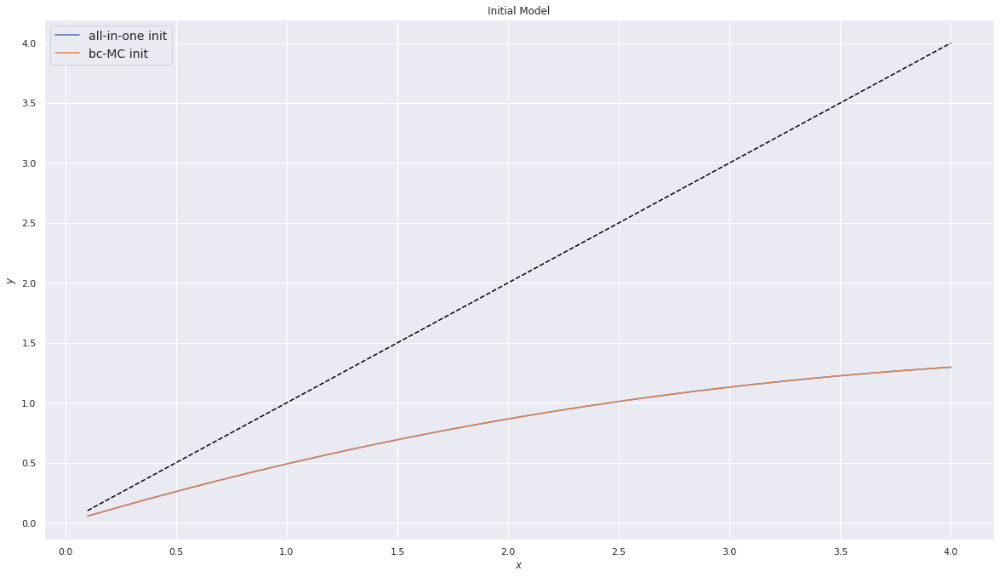

In [16]:
model_MC.eval()
model_Maliar.eval()
nb_points = 1000 #for plotting

with torch.no_grad():
    xvec = torch.linspace(params.x_low, params.x_high, nb_points).unsqueeze(1) #add a dimension
    y_init_Maliar = model_Maliar(xvec)
    y_init_MC = model_MC(xvec)

y_init_Maliar = y_init_Maliar.detach().numpy()
y_init_MC = y_init_MC.detach().numpy()

plt.title("ANN BEFORE TRAINING")
plt.plot(xvec, xvec, linestyle='--', color='black')
plt.plot(xvec, y_init_Maliar, label='all-in-one init')
plt.plot(xvec, y_init_MC, label='bc-MC init')
plt.xlabel("$x$")
plt.ylabel("$y$")
plt.title("Initial Model")
plt.legend()

In [17]:
with torch.no_grad():
    v = Ξ_torch(model_Maliar, params)
    print(v)

target = torch.tensor([0])
target.shape

tensor(0.2482)


torch.Size([1])

### Plotting the loss function

In [18]:
# Set test model to true value
model_test = NeuralNetwork().to(device)
set_initial_values(model_test, 0.0, torch.logit(torch.tensor([params.true_cst])))
#for name, param in model_MC.named_parameters():
#    print(name, param)
rep = 100
ll = torch.zeros(rep)
for i in range(0,100):
    with torch.no_grad():
        ll[i] = Ξ_torch(model_test, params)
print(torch.var(ll))
print(torch.mean(ll))

tensor(1.6696e-30)
tensor(8.0352e-15)


linear_relu_stack.0.weight Parameter containing:
tensor([[0.]], requires_grad=True)
linear_relu_stack.0.bias Parameter containing:
tensor([0.4726], requires_grad=True)


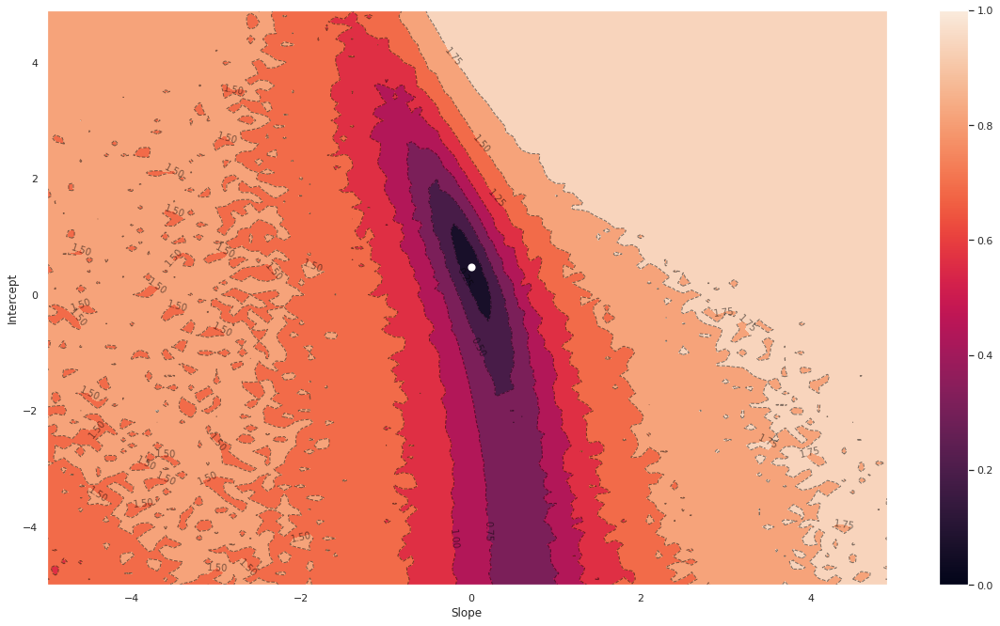

In [19]:
for name, param in model_test.named_parameters():
    print(name, param)
    
# Make data.
min_val_x= -5.0
max_val_x= 5.0
min_val_y= -5.0
max_val_y= 5.0

delta_grid=0.1
x_grid = np.arange(min_val_x, max_val_x, delta_grid)
y_grid = np.arange(min_val_y, max_val_y, delta_grid)
X_grid, Y_grid = np.meshgrid(x_grid, y_grid)
Z_AIO = np.zeros((len(x_grid), len(y_grid)))

for (y_index, y_value) in enumerate(y_grid):
    for (x_index, x_value) in enumerate(x_grid):
        set_initial_values(model_test, x_value, y_value)
        #for name, param in model_MC.named_parameters():
        #    print(name, param)
        with torch.no_grad():
            ll = Ξ_torch(model_test, params)
        Z_AIO[y_index, x_index] = ll.detach().numpy()

min_iter_plot = 1
max_iter_plot = 20
cp = plt.contour(X_grid, Y_grid, np.sqrt(Z_AIO), colors='black', linestyles='dashed', linewidths=1, alpha=0.5)
plt.clabel(cp, inline=1, fontsize=10)
cp = plt.contourf(X_grid, Y_grid, np.sqrt(Z_AIO))

plt.scatter([0], [torch.logit(torch.tensor([params.true_cst])).numpy()], s=10, c='white', linewidth=5.0)

# Add arrows for gradient:
plt.xlabel('Slope')
plt.ylabel('Intercept')

plt.colorbar()

figname = output_folder + 'contour_plot_AIO.png'
plt.savefig(figname)
plt.show()

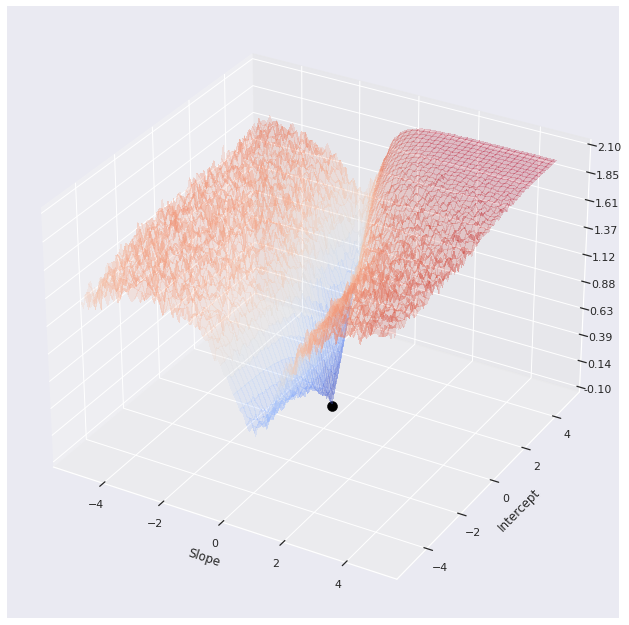

In [20]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Plot the surface.
surf = ax.plot_surface(X_grid, Y_grid, np.sqrt(Z_AIO), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)

# Customize the z axis.
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

ax.scatter([0.0], [torch.logit(torch.tensor([params.true_cst])).numpy()], [0.0], s=100, c='black', linewidth=0.5)
plt.xlabel('Slope')
plt.ylabel('Intercept')

figname = output_folder + 'surface_plot_AIO.png'
plt.savefig(figname)
plt.show()

### Train AIO

In [21]:
random.seed(seed_number)
torch.manual_seed(seed_number)
model_Maliar.train()

if params.optimizer == "Adam":
    optimizer = torch.optim.Adam(model_Maliar.parameters(), lr=params.lr, eps=1e-07, betas=(0.9, 0.999)) 
elif params.optimizer == "SGD":
    optimizer = torch.optim.SGD(model_Maliar.parameters(), params.lr)
elif params.optimizer == "SWA":
    base_opt = torch.optim.Adam(model_Maliar.parameters(), lr=params.lr, eps=1e-07, betas=(0.9, 0.999)) 
    optimizer = SWA(base_opt, swa_start=params.swa_start, swa_freq=params.swa_freq, swa_lr=params.lr)
else:
    raise("optimizer unknown")

# A LOOP OVER EACH POINT OF THE CURRENT GRID
# store mean loss by epoch
scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=params.freq_gamma)
loss_epochs = torch.zeros(params.nb_epochs)
list_perc_abs_error_Maliar = [] #store abs value percentage error
list_perc_abs_error_Maliar_i = [] #store index i
list_perc_abs_error_Maliar_loss = [] #store loss
list_Maliar_gradient = [] #store norm of gradient
calculate_variance_grad = False 
freq_loss = 1
# Monitor performance on a fixed grid:
with torch.no_grad():
    xvec = torch.linspace(params.x_low, params.x_high, nb_points).unsqueeze(1) #add a dimension
    xvec_numpy = xvec.detach().numpy()
    f_true = params.true_function(xvec_numpy)
    
for i in tqdm(range(0, params.nb_epochs)):
    loss = Ξ_torch(model_Maliar, params)
    loss_epochs[[i]] = float(loss.item())

    # Backpropagation
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    if i % freq_loss == 0: #Monitor the predictive power
        # Define the grid
        with torch.no_grad():
            #xvec = torch.linspace(params.x_low, params.x_high, nb_points).unsqueeze(1) #add a dimension
            y_Maliar = model_Maliar(xvec)
        #xvec = xvec.detach().numpy()
        y_Maliar = y_Maliar.detach().numpy()
        perc_abs_error_Maliar = 100*(np.abs((y_Maliar - f_true)/f_true))
        list_perc_abs_error_Maliar.append(np.median(perc_abs_error_Maliar))
        list_perc_abs_error_Maliar_i.append(i)
        list_perc_abs_error_Maliar_loss.append(float(loss.item()))
        # Store the norm of the gradient
        if calculate_variance_grad == True:
            total_norm = 0
            for p in model_Maliar.parameters():
                param_norm = p.grad.detach().data.norm(2)
                total_norm += param_norm.item() ** 2
            total_norm = total_norm ** 0.5
            list_Maliar_gradient.append(total_norm)
    if i % 1000 == 0: #Monitor the loss
        loss, current = float(loss.item()), i
        print(f"loss: {loss:>7f}, median euler error {list_perc_abs_error_Maliar[-1]:>7f}, [{current:>5d}/{params.nb_epochs:>5d}]")
    if (i % params.freq_scheduler == 0) & (i != 0) & (params.use_scheduler == True):
        scheduler.step()
        print("i : {}. Decreasing learning rate: {}".format(i, scheduler.get_last_lr()))

if params.optimizer == "SWA":
    optimizer.swap_swa_sgd()

  1%|▎                                      | 84/10000 [00:00<00:23, 418.42it/s]

loss: 0.298395, median euler error 15.000537, [    0/10000]


 11%|████                                 | 1104/10000 [00:02<00:15, 574.78it/s]

loss: 0.000000, median euler error 0.000008, [ 1000/10000]


 21%|███████▋                             | 2066/10000 [00:03<00:14, 565.59it/s]

loss: 0.000000, median euler error 0.000008, [ 2000/10000]


 31%|███████████▍                         | 3089/10000 [00:05<00:13, 496.65it/s]

loss: 0.000000, median euler error 0.000007, [ 3000/10000]


 41%|███████████████                      | 4058/10000 [00:07<00:10, 548.39it/s]

loss: 0.000000, median euler error 0.000008, [ 4000/10000]


 51%|██████████████████▊                  | 5080/10000 [00:09<00:09, 544.15it/s]

loss: 0.000000, median euler error 0.000008, [ 5000/10000]


 61%|██████████████████████▋              | 6117/10000 [00:11<00:06, 602.43it/s]

loss: 0.000000, median euler error 0.000007, [ 6000/10000]


 71%|██████████████████████████▎          | 7108/10000 [00:12<00:05, 521.66it/s]

loss: 0.000000, median euler error 0.000007, [ 7000/10000]


 81%|█████████████████████████████▊       | 8054/10000 [00:14<00:03, 590.88it/s]

loss: 0.000000, median euler error 0.000007, [ 8000/10000]


 91%|█████████████████████████████████▌   | 9085/10000 [00:16<00:01, 522.55it/s]

loss: 0.000000, median euler error 0.000007, [ 9000/10000]


100%|████████████████████████████████████| 10000/10000 [00:18<00:00, 549.50it/s]


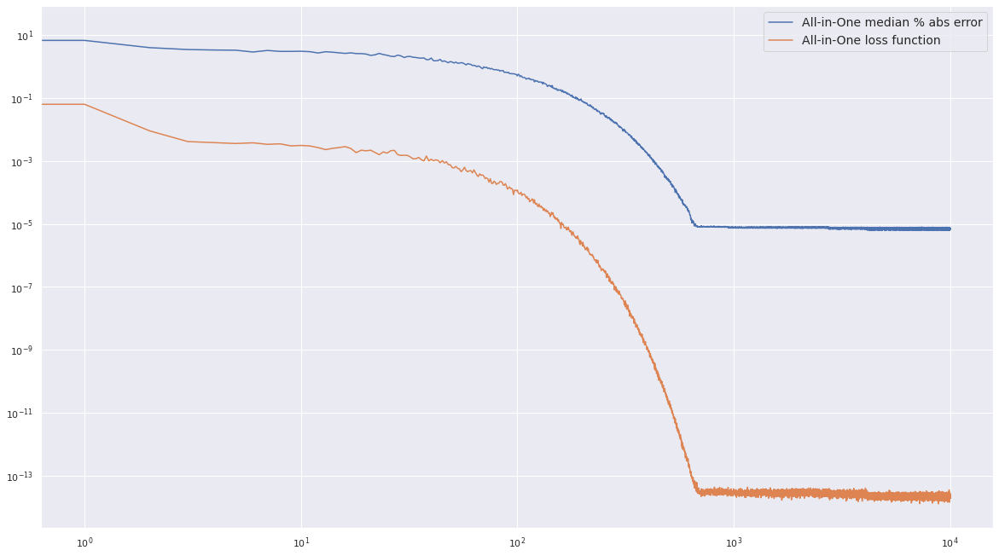

In [22]:
plt.plot(list_perc_abs_error_Maliar_i, list_perc_abs_error_Maliar, label="All-in-One median % abs error")
plt.plot(list_perc_abs_error_Maliar_i, np.abs(list_perc_abs_error_Maliar_loss), label="All-in-One loss function")
plt.xscale('log')
plt.yscale('log')
plt.legend()

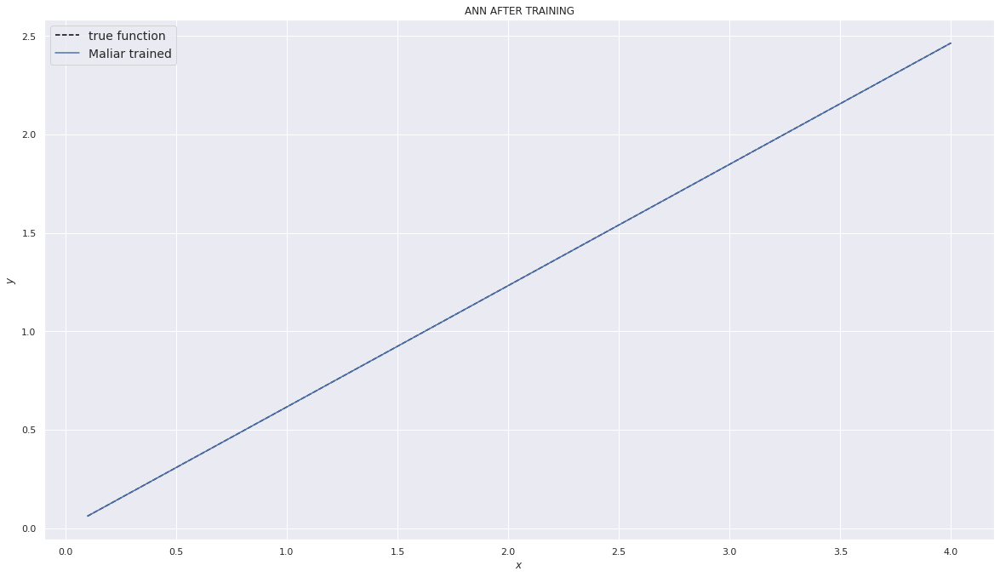

In [23]:
# Test approximation
model_Maliar.eval()
model_MC.eval()

# Define the grid
with torch.no_grad():
    xvec = torch.linspace(params.x_low, params.x_high, nb_points).unsqueeze(1) #add a dimension
    y_Maliar = model_Maliar(xvec)

xvec = xvec.detach().numpy()
y_Maliar = y_Maliar.detach().numpy()

plt.plot(xvec, params.true_function(xvec), linestyle='--', color='black', label="true function")
plt.plot(xvec, y_Maliar, label='Maliar trained')
#plt.plot(xvec, y_MC, label='Monte Carlo trained')
plt.xlabel("$x$")
plt.ylabel("$y$")
plt.title("ANN AFTER TRAINING")
plt.legend()


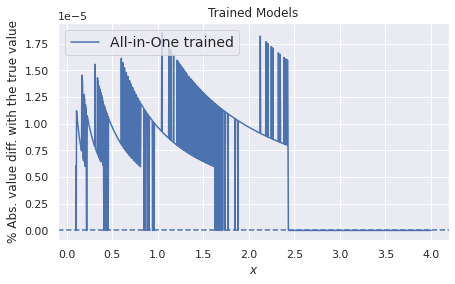

In [24]:
#fmt = '%.00f%%' # Format you want the ticks, e.g. '40%'
#xticks = mtick.FormatStrFormatter(fmt)

perc_abs_error_Maliar = 100*(np.abs((y_Maliar - params.true_function(xvec))/params.true_function(xvec)))

fig = plt.figure(1, (7,4))
ax = fig.add_subplot(1,1,1)
ax.plot(xvec, perc_abs_error_Maliar, label='All-in-One trained')
#ax.plot(xvec, perc_abs_error_MC, label='Monte Carlo trained')
plt.axhline(y = 0.0, color = 'b', linestyle = '--')
plt.xlabel("$x$")
plt.ylabel("% Abs. value diff. with the true value")
plt.title("Trained Models")
#ax.yaxis.set_major_formatter(xticks)
plt.legend()

## II.B. bc-MC

* Implement the developed formula

$$ \frac{1}{M} \frac{2}{(N)(N-1)} \sum_{m=1}^{M} \sum_{1\leq i < j}^{n} f(s_m, \epsilon_{m}^{(i)})f(s_m, \epsilon_{m}^{(j)})  $$

* This formula can be vectorized as follows:


$$ f' \Big(I_N \otimes U\Big). f $$

### Plotting the loss function


In [25]:
# Set test model to true value
model_test = NeuralNetwork().to(device)
set_initial_values(model_test, 0.0, torch.logit(torch.tensor([params.true_cst])))
#for name, param in model_MC.named_parameters():
#    print(name, param)
rep = 100
ll = torch.zeros(rep)
for i in range(0,100):
    with torch.no_grad():
        ll[i] = Ξ_torch_MC(model_test, params)
print(torch.var(ll))
print(torch.mean(ll))

tensor(5.9130e-29)
tensor(8.6526e-15)


linear_relu_stack.0.weight Parameter containing:
tensor([[0.]], requires_grad=True)
linear_relu_stack.0.bias Parameter containing:
tensor([0.4726], requires_grad=True)


/tmp/ipykernel_922136/4263439789.py:27: RuntimeWarning: invalid value encountered in sqrt
  cp = plt.contour(X_grid, Y_grid, np.sqrt(Z_MC), colors='black', linestyles='dashed', linewidths=1, alpha=0.5)
/tmp/ipykernel_922136/4263439789.py:29: RuntimeWarning: invalid value encountered in sqrt
  cp = plt.contourf(X_grid, Y_grid, np.sqrt(Z_MC))


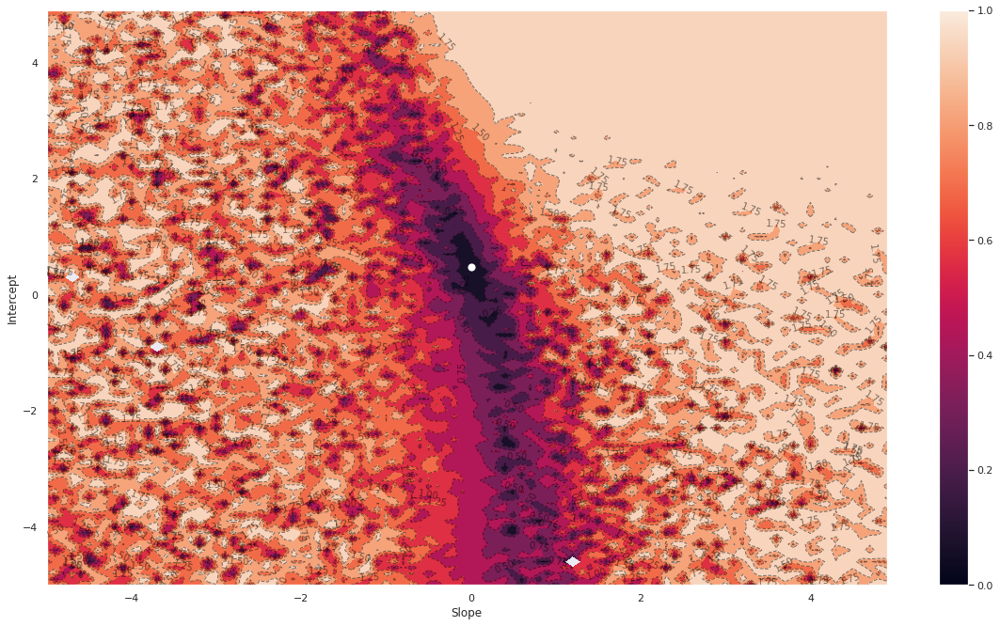

In [26]:
for name, param in model_test.named_parameters():
    print(name, param)
    
# Make data.
min_val_x= -5.0
max_val_x= 5.0
min_val_y= -5.0
max_val_y= 5.0

delta_grid=0.1
x_grid = np.arange(min_val_x, max_val_x, delta_grid)
y_grid = np.arange(min_val_y, max_val_y, delta_grid)
X_grid, Y_grid = np.meshgrid(x_grid, y_grid)
Z_MC = np.zeros((len(x_grid), len(y_grid)))

for (y_index, y_value) in enumerate(y_grid):
    for (x_index, x_value) in enumerate(x_grid):
        set_initial_values(model_test, x_value, y_value)
        #for name, param in model_MC.named_parameters():
        #    print(name, param)
        with torch.no_grad():
            ll = Ξ_torch_MC(model_test, params)
        Z_MC[y_index, x_index] = ll.detach().numpy()

min_iter_plot = 1
max_iter_plot = 20
cp = plt.contour(X_grid, Y_grid, np.sqrt(Z_MC), colors='black', linestyles='dashed', linewidths=1, alpha=0.5)
plt.clabel(cp, inline=1, fontsize=10)
cp = plt.contourf(X_grid, Y_grid, np.sqrt(Z_MC))

plt.scatter([0], [torch.logit(torch.tensor([params.true_cst])).numpy()], s=10, c='white', linewidth=5.0)

# Add arrows for gradient:
plt.xlabel('Slope')
plt.ylabel('Intercept')

plt.colorbar()

figname = output_folder + 'contour_plot_MC_M_{}.png'.format(params.M)
plt.savefig(figname)
plt.show()

/tmp/ipykernel_922136/4169535828.py:5: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  surf = ax.plot_surface(X_grid, Y_grid, np.real(np.sqrt(Z_MC, dtype=np.complex)), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)


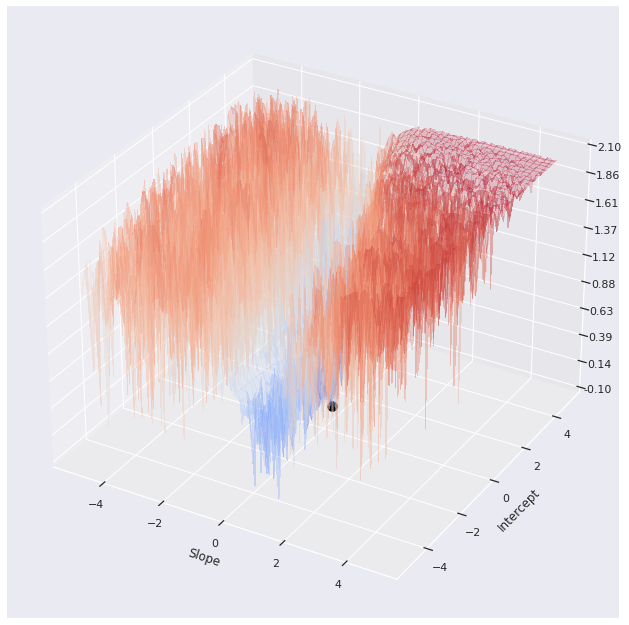

In [27]:
fig, ax = plt.subplots(subplot_kw={"projection": "3d"})

# Plot the surface.
# Sometimes negative values. np.sqrt does not like it. It take the real part of the imaginary number.
surf = ax.plot_surface(X_grid, Y_grid, np.real(np.sqrt(Z_MC, dtype=np.complex)), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)

# Customize the z axis.
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

ax.scatter([0.0], [torch.logit(torch.tensor([params.true_cst])).numpy()], [0.0], s=100, c='black', linewidth=0.5)
plt.xlabel('Slope')
plt.ylabel('Intercept')

#plt.suptitle("Loss function and absol".format(params.σ_e), fontsize=14)
figname = output_folder + 'surface_plot_MC_M_{}.png'.format(params.M)
plt.savefig(figname)
plt.show()

/tmp/ipykernel_922136/4106274639.py:8: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  surf = ax2.plot_surface(X_grid, Y_grid, np.real(np.sqrt(Z_MC, dtype=np.complex)), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)


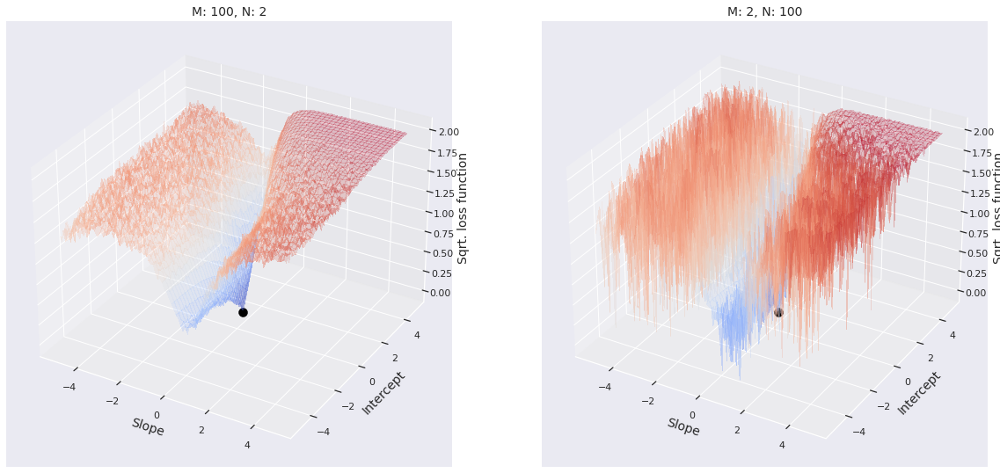

In [28]:
# Combine surface plots
fig, (ax1, ax2) = plt.subplots(1, 2, subplot_kw={"projection": "3d"})

# Plot the surface.
surf = ax1.plot_surface(X_grid, Y_grid, np.sqrt(Z_AIO), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)

# Sometimes negative values. np.sqrt does not like it. It take the real part of the imaginary number.
surf = ax2.plot_surface(X_grid, Y_grid, np.real(np.sqrt(Z_MC, dtype=np.complex)), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)

# Customize the z axis.
ax.zaxis.set_major_locator(LinearLocator(10))
# A StrMethodFormatter is used automatically
ax.zaxis.set_major_formatter('{x:.02f}')

ax1.scatter([0.0], [torch.logit(torch.tensor([params.true_cst])).numpy()], [0.0], s=100, c='black', linewidth=0.5)
ax1.set_xlabel('Slope', fontsize=MEDIUM_SIZE)
ax1.set_ylabel('Intercept', fontsize=MEDIUM_SIZE)
ax1.zaxis.set_rotate_label(False) 
ax1.set_zlabel('Sqrt. loss function', fontsize=MEDIUM_SIZE, rotation=90)
ax1.set_title('M: {}, N: {}'.format(params.T, 2), size=MEDIUM_SIZE)

ax2.scatter([0.0], [torch.logit(torch.tensor([params.true_cst])).numpy()], [0.0], s=100, c='black', linewidth=0.5)
ax2.set_xlabel('Slope', fontsize=MEDIUM_SIZE)
ax2.set_ylabel('Intercept', fontsize=MEDIUM_SIZE)
ax2.zaxis.set_rotate_label(False) 
ax2.set_zlabel('Sqrt. loss function', fontsize=MEDIUM_SIZE, rotation=90)
ax2.set_title('M: {}, N: {}'.format(params.M, params.N), size=MEDIUM_SIZE)

#plt.suptitle("Loss function and absol".format(params.σ_e), fontsize=14)
figname = output_folder + 'surface_plot_AIO_and_MC_M_{}_σ_e_{}.png'.format(params.M, params.σ_e)
plt.savefig(figname)
plt.show()


In [29]:
params.true_cst

0.616

In [30]:
with torch.no_grad():
    v = Ξ_torch_MC(model_MC, params)
    print(v)

target = torch.tensor([0])
target.shape

tensor(0.1087)


torch.Size([1])

In [31]:
random.seed(seed_number)
model_MC.train()

if params.optimizer == "Adam":
    optimizer = torch.optim.Adam(model_MC.parameters(), lr=params.lr, eps=1e-07, betas=(0.9, 0.999)) 
elif params.optimizer == "SGD":
    optimizer = torch.optim.SGD(model_MC.parameters(), params.lr)
elif params.optimizer == "SWA":
    base_opt = torch.optim.Adam(model_MC.parameters(), lr=params.lr, eps=1e-07, betas=(0.9, 0.999)) 
    optimizer = SWA(base_opt, swa_start=params.swa_start, swa_freq=params.swa_freq, swa_lr=params.lr)
else:
    raise("optimizer unknown")

scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=params.freq_gamma)
loss_epochs_MC = torch.zeros(params.nb_epochs)
list_perc_abs_error_MC = [] #store abs value percentage error
list_perc_abs_error_MC_i = [] #store index i
list_perc_abs_error_MC_loss = [] #store loss
list_MC_gradient = [] #store the norm of the gradient
calculate_variance_grad = False 
freq_loss = 1
# Monitor performance on a fixed grid:
with torch.no_grad():
    xvec = torch.linspace(params.x_low, params.x_high, nb_points).unsqueeze(1) #add a dimension
    xvec_numpy = xvec.detach().numpy()
    f_true = params.true_function(xvec_numpy)
    
for i in tqdm(range(0, params.nb_epochs)):
    loss = Ξ_torch_MC(model_MC, params)
    loss_epochs_MC[[i]] = float(loss.item())

    # Backpropagation
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    
    if i % freq_loss == 0: #Monitor the predictive power
        # Define the grid
        with torch.no_grad():
            #xvec = torch.linspace(params.x_low, params.x_high, nb_points).unsqueeze(1) #add a dimension
            y_MC = model_MC(xvec)
        #xvec = xvec.detach().numpy()
        y_MC = y_MC.detach().numpy()
        perc_abs_error_MC = 100*(np.abs((y_MC - f_true)/f_true))
        list_perc_abs_error_MC.append(np.median(perc_abs_error_MC))
        list_perc_abs_error_MC_i.append(i)
        list_perc_abs_error_MC_loss.append(float(loss.item()))
        if calculate_variance_grad == True:
            total_norm = 0
            # Store the norm of the gradient
            for p in model_MC.parameters():
                param_norm = p.grad.detach().data.norm(2)
                total_norm += param_norm.item() ** 2
            total_norm = total_norm ** 0.5
            list_MC_gradient.append(total_norm)
    if i % 1000 == 0:
        loss, current = float(loss.item()), i
        print(f"loss: {loss:>7f}, median euler error {list_perc_abs_error_MC[-1]:>7f}, [{current:>5d}/{params.nb_epochs:>5d}]")
    if (i % params.freq_scheduler == 0) & (i != 0) & (params.use_scheduler == True):
        scheduler.step()
        print("i : {}. Decreasing learning rate: {}".format(i, scheduler.get_last_lr()))

if params.optimizer == "SWA":
    optimizer.swap_swa_sgd()

  0%|▏                                      | 41/10000 [00:00<00:24, 403.78it/s]

loss: 0.058005, median euler error 28.047020, [    0/10000]


 10%|███▉                                 | 1048/10000 [00:02<00:19, 449.76it/s]

loss: 0.000000, median euler error 0.000000, [ 1000/10000]


 21%|███████▋                             | 2083/10000 [00:04<00:17, 449.53it/s]

loss: 0.000000, median euler error 0.000000, [ 2000/10000]


 31%|███████████▎                         | 3064/10000 [00:07<00:19, 351.55it/s]

loss: 0.000000, median euler error 0.000000, [ 3000/10000]


 41%|███████████████▏                     | 4098/10000 [00:10<00:12, 475.57it/s]

loss: 0.000000, median euler error 0.000000, [ 4000/10000]


 51%|██████████████████▊                  | 5078/10000 [00:12<00:10, 487.80it/s]

loss: 0.000000, median euler error 0.000000, [ 5000/10000]


 60%|██████████████████████▎              | 6045/10000 [00:14<00:09, 403.02it/s]

loss: 0.000000, median euler error 0.000000, [ 6000/10000]


 70%|██████████████████████████           | 7049/10000 [00:16<00:06, 491.13it/s]

loss: 0.000000, median euler error 0.000000, [ 7000/10000]


 80%|█████████████████████████████▋       | 8036/10000 [00:19<00:04, 402.96it/s]

loss: 0.000000, median euler error 0.000000, [ 8000/10000]


 91%|█████████████████████████████████▋   | 9091/10000 [00:21<00:02, 448.83it/s]

loss: 0.000000, median euler error 0.000010, [ 9000/10000]


100%|████████████████████████████████████| 10000/10000 [00:23<00:00, 423.63it/s]


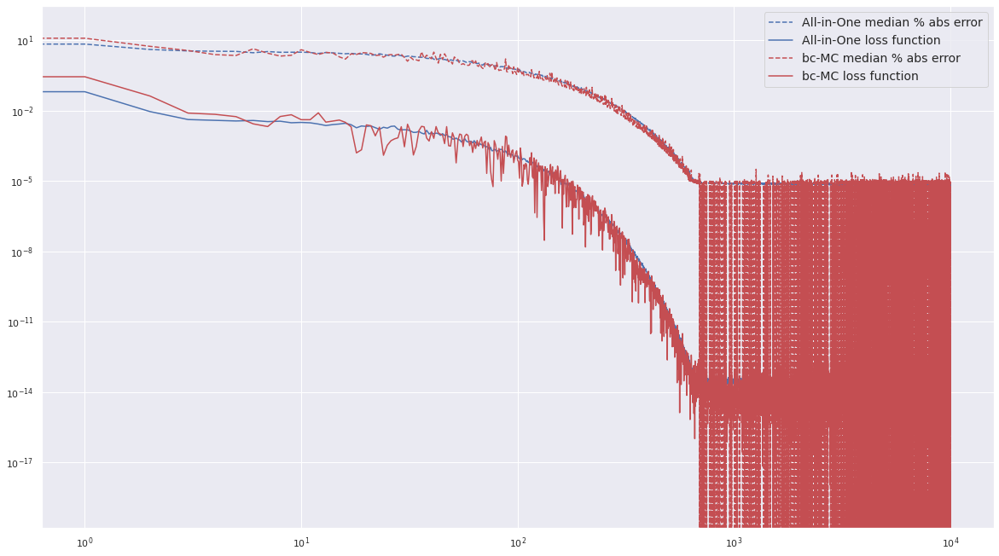

In [32]:
plt.plot(list_perc_abs_error_Maliar_i, list_perc_abs_error_Maliar, label="All-in-One median % abs error", linestyle="--", color='b')
plt.plot(list_perc_abs_error_Maliar_i, np.abs(list_perc_abs_error_Maliar_loss), label="All-in-One loss function", color='b')
plt.plot(list_perc_abs_error_MC_i, list_perc_abs_error_MC, label="bc-MC median % abs error", linestyle="--", color='r')
plt.plot(list_perc_abs_error_MC_i, np.abs(list_perc_abs_error_MC_loss), label="bc-MC loss function", color='r')
plt.xscale('log')
plt.yscale('log')
plt.legend()

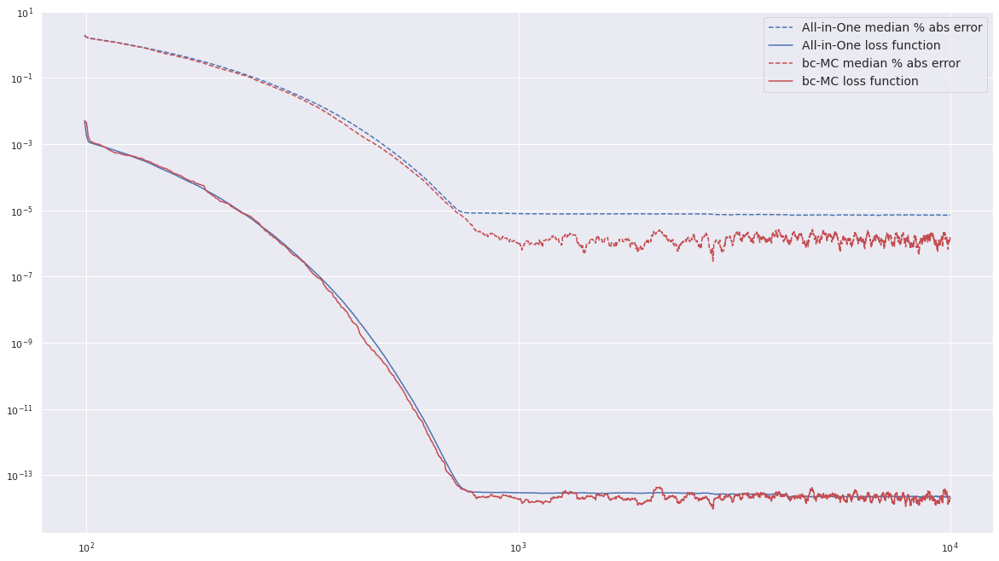

In [33]:
rate = 100
plt.plot(list_perc_abs_error_Maliar_i, pd.Series(list_perc_abs_error_Maliar).rolling(rate).mean(), label="All-in-One median % abs error", linestyle="--", color='b')
plt.plot(list_perc_abs_error_Maliar_i, pd.Series(np.abs(list_perc_abs_error_Maliar_loss)).rolling(rate).mean(), label="All-in-One loss function", color='b')
plt.plot(list_perc_abs_error_MC_i, pd.Series(list_perc_abs_error_MC).rolling(rate).mean(), label="bc-MC median % abs error", linestyle="--", color='r')
plt.plot(list_perc_abs_error_MC_i, pd.Series(np.abs(list_perc_abs_error_MC_loss)).rolling(rate).mean(), label="bc-MC loss function", color='r')
plt.xscale('log')
plt.yscale('log')
plt.legend()

In [34]:
list_names = ["All-in-One" for k in range(0, len(list_perc_abs_error_Maliar))]
list_perc_abs_error_Maliar= np.array(list_perc_abs_error_Maliar)
list_perc_abs_error_MC = np.array(list_perc_abs_error_MC)

list_perc_abs_error_Maliar_i= np.array(list_perc_abs_error_Maliar_i)
list_perc_abs_error_MC_i = np.array(list_perc_abs_error_MC_i)

list_perc_abs_error_Maliar_loss = np.array(list_perc_abs_error_Maliar_loss)
list_perc_abs_error_MC_loss = np.array( list_perc_abs_error_MC_loss)

list_names = list_names + ["MC" for k in range(0, len(list_perc_abs_error_MC))]
abs_error = np.concatenate((list_perc_abs_error_Maliar, list_perc_abs_error_MC), axis=0)
indices = np.concatenate((list_perc_abs_error_Maliar_i, list_perc_abs_error_MC_i), axis=0)
losses = np.concatenate((list_perc_abs_error_Maliar_loss, list_perc_abs_error_MC_loss), axis=0)
df_abs_error = pd.DataFrame({'i': indices, 'name': list_names, 'perc_abs_error': abs_error, "loss": losses})
df_abs_error
#sns.lmplot(x='mean_loss', y='mean abs % error', data=df_sel, hue='name')

,i,name,perc_abs_error,loss
0,0,All-in-One,15.000537,2.983946e-01
1,1,All-in-One,6.905002,6.425299e-02
2,2,All-in-One,4.063282,9.166631e-03
3,3,All-in-One,3.534704,4.191517e-03
4,4,All-in-One,3.417293,3.857895e-03
...,...,...,...,...
19995,9995,MC,0.000000,3.597090e-15
19996,9996,MC,0.000000,5.493218e-16
19997,9997,MC,0.000000,4.238328e-15
19998,9998,MC,0.000000,1.094588e-15


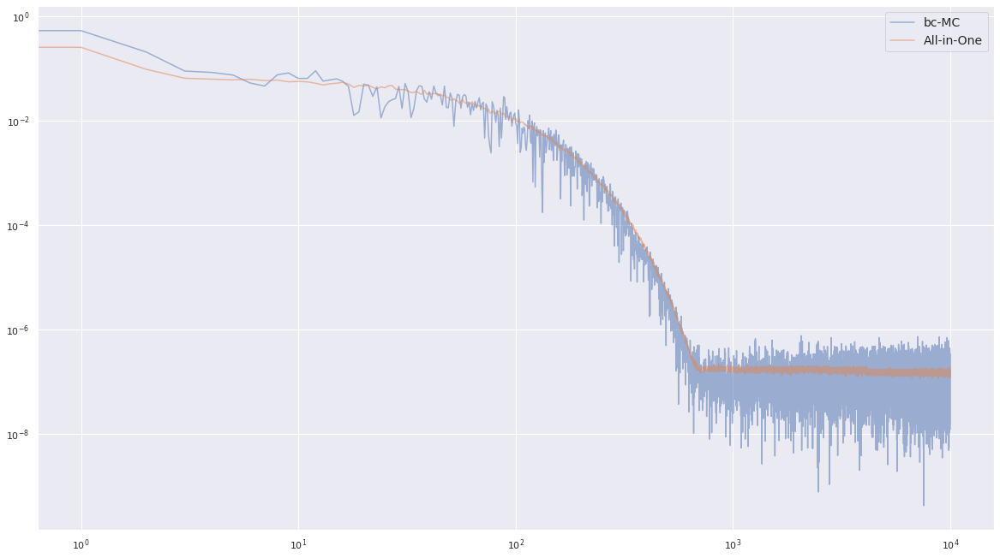

In [35]:
plt.plot(np.sqrt( np.abs(loss_epochs_MC)), label="bc-MC", alpha=0.5)
plt.plot(np.sqrt( np.abs(loss_epochs)), label="All-in-One", alpha=0.5)
plt.xscale('log')
plt.yscale('log')
plt.legend()

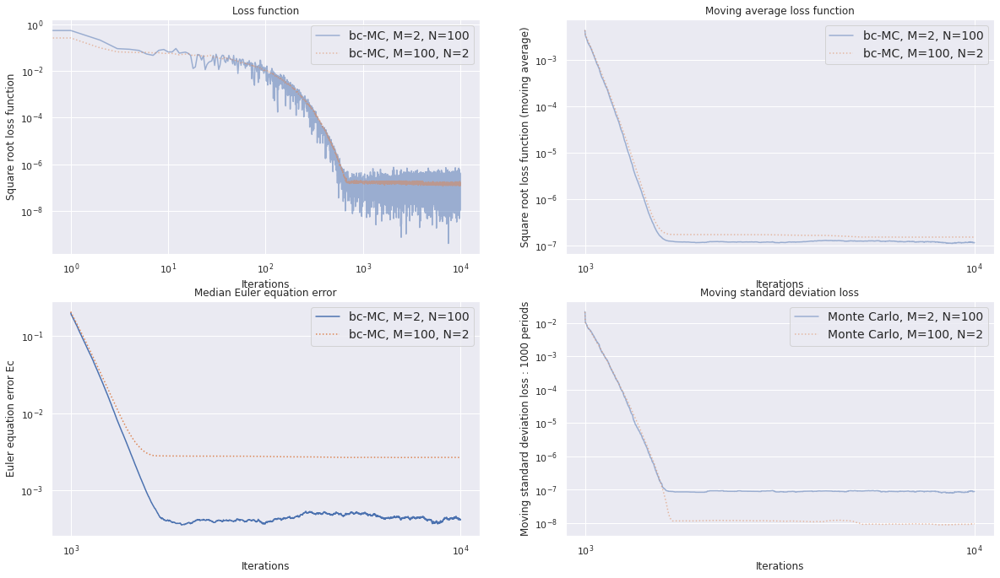

In [36]:
plot_scale = 1.25
rate=1
last_N_values = 2
plt.rcParams["figure.figsize"] = (plot_scale*16, plot_scale*9)
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

rate = 1
#fig.suptitle('Horizontally stacked subplots')
ax1.plot(pd.Series(np.sqrt( np.abs(loss_epochs_MC))).rolling(rate).mean(), label="bc-MC, M={}, N={}".format(params.M, params.N), alpha=0.5)
ax1.plot(pd.Series(np.sqrt( np.abs(loss_epochs))).rolling(rate).mean(), label="bc-MC, M={}, N={}".format(params.T, 2), alpha=0.5, linestyle='dotted')
ax1.set_xscale('log')
ax1.set_yscale('log')
ax1.set_ylabel('Square root loss function')
ax1.set_xlabel('Iterations')
ax1.set_title('Loss function')
ax1.legend()


rate = 1000
#fig.suptitle('Horizontally stacked subplots')
ax2.plot(pd.Series(np.sqrt( np.abs(loss_epochs_MC))).rolling(rate).mean(), label="bc-MC, M={}, N={}".format(params.M, params.N), alpha=0.5)
ax2.plot(pd.Series(np.sqrt( np.abs(loss_epochs))).rolling(rate).mean(), label="bc-MC, M={}, N={}".format(params.T, 2), alpha=0.5, linestyle='dotted')
ax2.set_xscale('log')
ax2.set_yscale('log')
ax2.set_ylabel('Square root loss function (moving average)')
ax2.set_xlabel('Iterations')
ax2.set_title('Moving average loss function')
ax2.legend()

rate=1000
ax3.plot(list_perc_abs_error_MC_i, pd.Series(np.sqrt(list_perc_abs_error_MC)).rolling(rate).mean(), label="bc-MC, M={}, N={}".format(params.M, params.N))
ax3.plot(list_perc_abs_error_Maliar_i, pd.Series(np.sqrt(list_perc_abs_error_Maliar)).rolling(rate).mean(), label="bc-MC, M={}, N={}".format(params.T, 2), linestyle='dotted')
ax3.set_xscale('log')
ax3.set_yscale('log')
ax3.set_ylabel('Euler equation error Ec')
ax3.set_xlabel('Iterations')
ax3.set_title('Median Euler equation error')
ax3.legend()

rate = 1000
#fig.suptitle('Horizontally stacked subplots')
ax4.plot(pd.Series(np.sqrt( np.abs(loss_epochs_MC))).rolling(rate).std(), label="Monte Carlo, M={}, N={}".format(params.M, params.N), alpha=0.5)
ax4.plot(pd.Series(np.sqrt( np.abs(loss_epochs))).rolling(rate).std(), label="Monte Carlo, M={}, N={}".format(params.T, 2), alpha=0.5, linestyle='dotted')
ax4.set_xscale('log')
ax4.set_yscale('log')
ax4.set_ylabel('Moving standard deviation loss : {} periods'.format(rate ))
ax4.set_xlabel('Iterations')
ax4.set_title('Moving standard deviation loss')
ax4.legend()

#plt.suptitle("Loss function and absol".format(params.σ_e), fontsize=14)
figname = output_folder + 'summmary_MC_bc.png'
plt.savefig(figname)
plt.show()

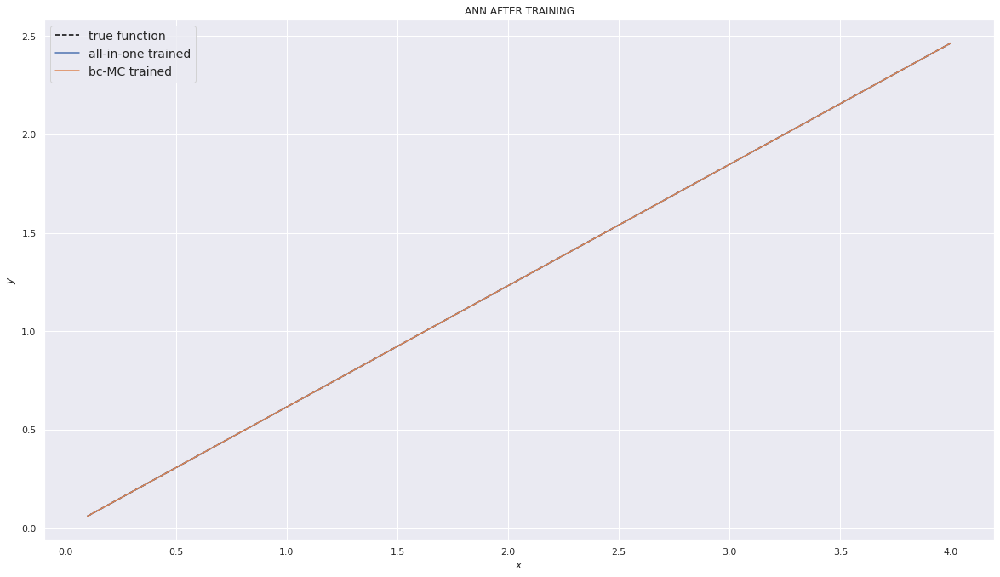

In [37]:
# Test approximation
model_Maliar.eval()
model_MC.eval()

# Define the grid
with torch.no_grad():
    xvec = torch.linspace(params.x_low, params.x_high, nb_points).unsqueeze(1) #add a dimension
    y_Maliar = model_Maliar(xvec)
    y_MC = model_MC(xvec)

xvec = xvec.detach().numpy()
y_Maliar = y_Maliar.detach().numpy()
y_MC = y_MC.detach().numpy()

plt.plot(xvec, params.true_function(xvec), linestyle='--', color='black', label="true function")
plt.plot(xvec, y_Maliar, label='all-in-one trained')
plt.plot(xvec, y_MC, label='bc-MC trained')
plt.xlabel("$x$")
plt.ylabel("$y$")
plt.title("ANN AFTER TRAINING")
plt.legend()


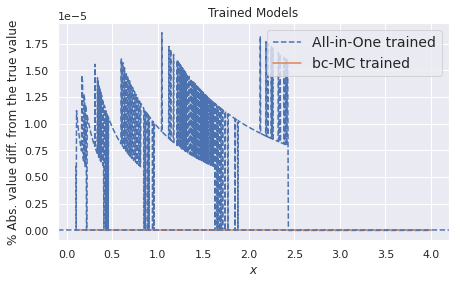

In [38]:
#fmt = '%.00f%%' # Format you want the ticks, e.g. '40%'
#xticks = mtick.FormatStrFormatter(fmt)

perc_abs_error_Maliar = 100*(np.abs((y_Maliar - params.true_function(xvec))/params.true_function(xvec)))
perc_abs_error_MC =100*(np.abs((y_MC - params.true_function(xvec))/params.true_function(xvec)))

fig = plt.figure(1, (7,4))
ax = fig.add_subplot(1,1,1)
ax.plot(xvec, perc_abs_error_Maliar, label='All-in-One trained', linestyle = '--')
ax.plot(xvec, perc_abs_error_MC, label='bc-MC trained')
plt.axhline(y = 0.0, color = 'b', linestyle = '--')
plt.xlabel("$x$")
plt.ylabel("% Abs. value diff. from the true value")
plt.title("Trained Models")
#ax.yaxis.set_major_formatter(xticks)
plt.legend()

In [39]:
print('------------------------------')
print(np.mean(perc_abs_error_Maliar))
print(np.mean(perc_abs_error_MC))

print('------------------------------')
print(np.median(perc_abs_error_Maliar))
print(np.median(perc_abs_error_MC))

print('------------------------------')
print(np.max(perc_abs_error_Maliar))
print(np.max(perc_abs_error_MC))


print('------------------------------')
print(np.std(perc_abs_error_Maliar))
print(np.std(perc_abs_error_MC))


------------------------------
5.7158527e-06
0.0
------------------------------
7.345572e-06
0.0
------------------------------
1.8523333e-05
0.0
------------------------------
5.2679075e-06
0.0


In [40]:
list_names = ["bc-MC", "bc-MC"]
list_mean_per_abs_error = [np.mean(perc_abs_error_Maliar), np.mean(perc_abs_error_MC)]
list_median_per_abs_error = [np.median(perc_abs_error_Maliar), np.median(perc_abs_error_MC)]
list_max_per_abs_error = [np.max(perc_abs_error_Maliar), np.max(perc_abs_error_MC)]
list_std_per_abs_error = [np.std(perc_abs_error_Maliar), np.std(perc_abs_error_MC)]


list_M_error = [params.N, params.M]
list_N_error = [2, params.N]
df_per_abs_error = pd.DataFrame({"estimator": list_names, 'M': list_M_error, 'N': list_N_error, 
                                 'mean % abs. error': list_mean_per_abs_error,
                                 'median % abs. error': list_median_per_abs_error,
                                 'max % abs. error': list_max_per_abs_error,
                                 'std. % abs. error': list_std_per_abs_error})
df_per_abs_error

,estimator,M,N,mean % abs. error,median % abs. error,max % abs. error,std. % abs. error
0,bc-MC,100,2,0.000006,0.000007,0.000019,0.000005
1,bc-MC,2,100,0.000000,0.000000,0.000000,0.000000


In [41]:
df_per_abs_error.to_csv(output_folder + 'df_per_abs_error.csv', index=False)

## III. Optimal choice of hyperparameters M and N: low uncertainty


### III.A. bc-MC estimator: optimal choice of M and N

Choose $M$ and $N$ to **minimize the variance of the loss**

In [42]:
T = (params.M*params.N)/2
#grid_N = np.concatenate((np.ones(1), np.array([N for N in range(2, 200+2, 2)])))
grid_N = np.array([N for N in range(2, params.T+2, 2)])
grid_M = 2*T/grid_N

is_int = grid_M % 1 == 0
grid_N = grid_N[is_int]
grid_M = grid_M[is_int]

print(grid_N)
print(grid_M)
print(grid_N*grid_M)

[  2   4   8  10  20  40  50 100]
[100.  50.  25.  20.  10.   5.   4.   2.]
[200. 200. 200. 200. 200. 200. 200. 200.]


#### Variance of the loss after x iterations

In [43]:
# params, nb_epoch_opt_M_N, nb_rep, nb_draws_loss, list_M, list_N
nb_iter_model = 0
initial_guess = [1.0, 1.0]
                
df_variance_loss, df_variance_loss_median = calculate_variance_loss(params, nb_iter_model, 5, 500, grid_M, grid_N, 
                                                                    norm_chosen = 2.0, freq_accuracy=1000, 
                                                                    calculate_variance_gradient=True, initial_guess=initial_guess)

Norm chosen: 2.0
Rep 0 / 5. Training a model for 0 Iterations
Rep 0 / 5. Calculting variance loss for 500 Iterations
Rep 0 / 5. Calculting variance norm gradient for 500 Iterations
Rep 1 / 5. Training a model for 0 Iterations
Rep 1 / 5. Calculting variance loss for 500 Iterations
Rep 1 / 5. Calculting variance norm gradient for 500 Iterations
Rep 2 / 5. Training a model for 0 Iterations
Rep 2 / 5. Calculting variance loss for 500 Iterations
Rep 2 / 5. Calculting variance norm gradient for 500 Iterations
Rep 3 / 5. Training a model for 0 Iterations
Rep 3 / 5. Calculting variance loss for 500 Iterations
Rep 3 / 5. Calculting variance norm gradient for 500 Iterations
Rep 4 / 5. Training a model for 0 Iterations
Rep 4 / 5. Calculting variance loss for 500 Iterations
Rep 4 / 5. Calculting variance norm gradient for 500 Iterations


/tmp/ipykernel_922136/2424432347.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  min_M = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['M'])
/tmp/ipykernel_922136/2424432347.py:3: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  min_N = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['N'])
/tmp/ipykernel_922136/2424432347.py:7: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  min_M_grad = int(df_variance_loss_median[df_variance_loss_median['P50_var_gradient_loss'] == min_var_grad]['M'])
/tmp/ipykernel_922136/2424432347.py:8: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(se

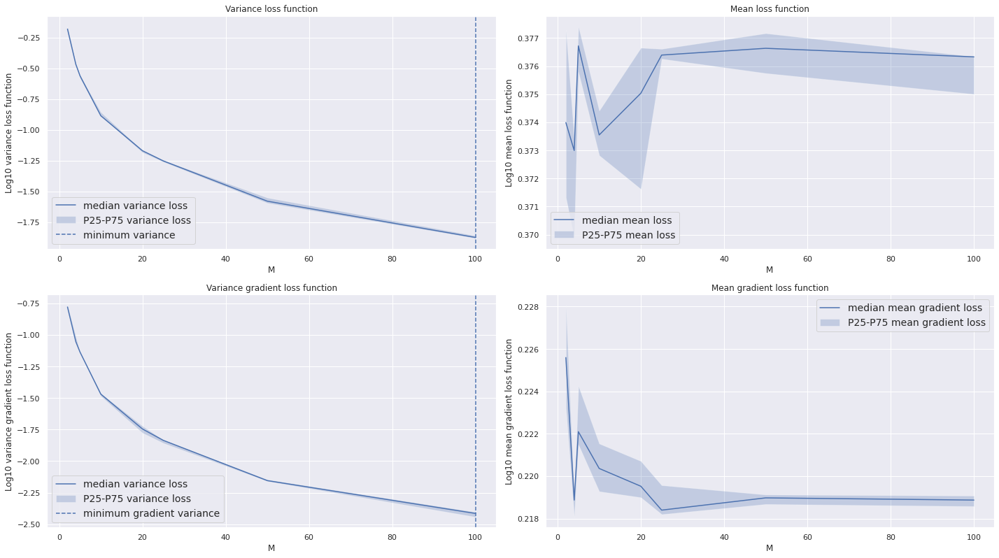

In [44]:
min_var = np.min(df_variance_loss_median['P50_var_loss'])
min_M = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['M'])
min_N = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['N'])

try:
    min_var_grad = np.min(df_variance_loss_median['P50_var_gradient_loss'])
    min_M_grad = int(df_variance_loss_median[df_variance_loss_median['P50_var_gradient_loss'] == min_var_grad]['M'])
    min_N_grad = int(df_variance_loss_median[df_variance_loss_median['P50_var_gradient_loss'] == min_var_grad]['N'])
except:
    print("error")
    
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

ax1.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_var_loss']), label="median variance loss")
ax1.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 variance loss", alpha=0.25)
ax1.axvline(min_M, label="minimum variance", linestyle="--")
ax1.set_xlabel("M")
ax1.set_ylabel("Log10 variance loss function")
ax1.set_title('Variance loss function')
ax1.legend()

ax2.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_mean_loss']), label="median mean loss")
ax2.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_mean_loss']), np.log10(df_variance_loss_median['P75_mean_loss']), label="P25-P75 mean loss", alpha=0.25)
ax2.set_xlabel("M")
ax2.set_ylabel("Log10 mean loss function")
ax2.set_title('Mean loss function')
ax2.legend()

ax3.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_var_gradient_loss']), label="median variance loss")
ax3.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_gradient_loss']), np.log10(df_variance_loss_median['P75_var_gradient_loss']), label="P25-P75 variance loss", alpha=0.25)
ax3.axvline(min_M_grad, label="minimum gradient variance", linestyle="--")
ax3.set_xlabel("M")
ax3.set_ylabel("Log10 variance gradient loss function")
ax3.set_title('Variance gradient loss function')
ax3.legend()

ax4.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_mean_gradient_loss']), label="median mean gradient loss")
ax4.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_mean_gradient_loss']), np.log10(df_variance_loss_median['P75_mean_gradient_loss']), label="P25-P75 mean gradient loss", alpha=0.25)
ax4.set_xlabel("M")
ax4.set_ylabel("Log10 mean gradient loss function")
ax4.set_title('Mean gradient loss function')
ax4.legend()

fig.tight_layout()
figname = output_folder + 'variance_loss_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname)
plt.show()


In [45]:
print("Minimizing the loss function")
print("variance loss")
print("Minimum error for M: {}.".format(min_M))
print("Minimum error for N: {}.".format(min_N))

print("variance gradient loss")
print("Minimum error for M: {}.".format(min_M_grad))
print("Minimum error for N: {}.".format(min_N_grad))

Minimizing the loss function
variance loss
Minimum error for M: 100.
Minimum error for N: 2.
variance gradient loss
Minimum error for M: 100.
Minimum error for N: 2.


/tmp/ipykernel_922136/2867632988.py:2: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  min_M = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['M'])
/tmp/ipykernel_922136/2867632988.py:3: FutureWarning: Calling int on a single element Series is deprecated and will raise a TypeError in the future. Use int(ser.iloc[0]) instead
  min_N = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['N'])


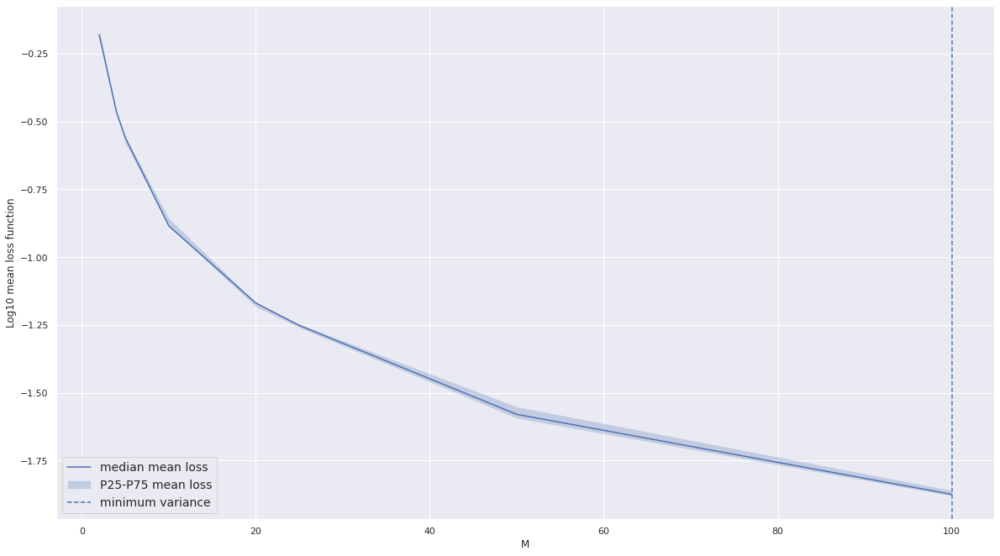

In [46]:
min_var = np.min(df_variance_loss_median['P50_var_loss'])
min_M = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['M'])
min_N = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['N'])

plt.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_var_loss']), label="median mean loss")
plt.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 mean loss", alpha=0.25)
plt.axvline(min_M, label="minimum variance", linestyle="--")
plt.xlabel("M")
plt.ylabel("Log10 mean loss function")
plt.legend()


In [47]:
df_variance_loss_median['optimizer'] = params.optimizer
df_variance_loss_median['sigma_e'] = params.σ_e
df_variance_loss_median['Sobol'] = params.use_Sobol
df_variance_loss_median['user_scheduler'] = params.use_scheduler
df_variance_loss_median['lr'] = params.lr

# Extra transformations
df_variance_loss_median['log10_variance_loss'] = np.log10(df_variance_loss_median['P50_var_loss'])
df_variance_loss_median['log10_variance_gradient_loss'] = np.log10(df_variance_loss_median['P50_var_gradient_loss'])
df_variance_loss_median['log_std_loss'] = np.log(df_variance_loss_median['P50_std_loss'])
df_variance_loss_median['log_std_gradient_loss'] = np.log(df_variance_loss_median['P50_std_gradient_loss'])


df_variance_loss_median.to_csv(output_folder + 'df_variance_loss_median_σ_e' + str(params.σ_e) + '.csv', index=False)

df_variance_loss_median

,M,N,var_loss,std_loss,mean_loss,var_gradient_loss,std_gradient_loss,mean_gradient_loss,nb_rep,min_var_loss,...,P90_mean_gradient_loss,optimizer,sigma_e,Sobol,user_scheduler,lr,log10_variance_loss,log10_variance_gradient_loss,log_std_loss,log_std_gradient_loss
0,2.0,100.0,0.660094,0.812462,2.365874,0.166553,0.408109,1.681104,2.0,0.652087,...,1.697846,SGD,0.5,False,False,0.1,-0.180394,-0.778449,-0.207687,-0.896222
1,4.0,50.0,0.341162,0.584091,2.360453,0.088410,0.297338,1.655284,2.0,0.311769,...,1.659831,SGD,0.5,False,False,0.1,-0.467040,-1.053498,-0.537699,-1.212884
2,5.0,40.0,0.275581,0.524958,2.380788,0.073236,0.270622,1.667626,2.0,0.254110,...,1.680551,SGD,0.5,False,False,0.1,-0.559750,-1.135273,-0.644436,-1.307031
3,10.0,20.0,0.130271,0.360931,2.363473,0.033972,0.184315,1.660980,2.0,0.123726,...,1.666925,SGD,0.5,False,False,0.1,-0.885153,-1.468877,-1.019070,-1.691107
4,20.0,10.0,0.067742,0.260272,2.371563,0.017990,0.134125,1.657778,2.0,0.064817,...,1.666362,SGD,0.5,False,False,0.1,-1.169144,-1.744980,-1.346027,-2.008982
5,25.0,8.0,0.055989,0.236620,2.378999,0.014621,0.120916,1.653483,2.0,0.052317,...,1.659392,SGD,0.5,False,False,0.1,-1.251898,-1.835029,-1.441300,-2.112655
6,50.0,4.0,0.026333,0.162276,2.380319,0.007010,0.083725,1.655684,2.0,0.024227,...,1.657988,SGD,0.5,False,False,0.1,-1.579494,-2.154289,-1.818459,-2.480216
7,100.0,2.0,0.013356,0.115567,2.378646,0.003851,0.062056,1.655288,2.0,0.012671,...,1.657591,SGD,0.5,False,False,0.1,-1.874332,-2.414431,-2.157904,-2.779716


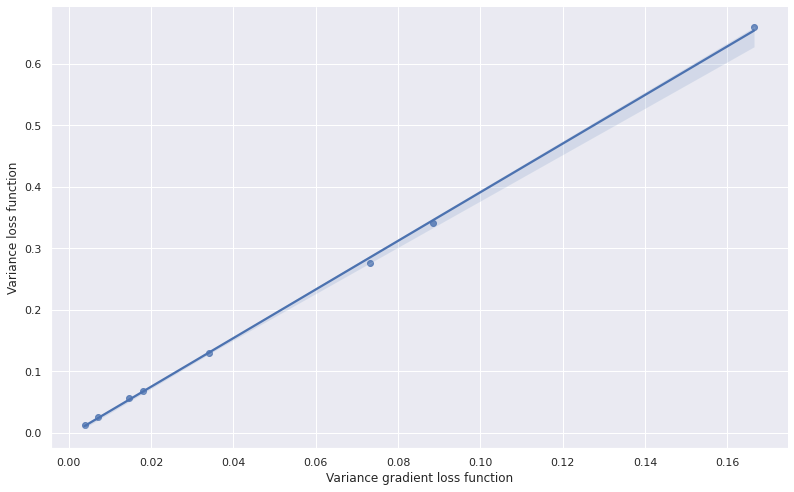

In [48]:
ax = sns.lmplot(x='var_gradient_loss', y='var_loss', data=df_variance_loss_median, height=7, aspect=1.6)
ax.set(xlabel='Variance gradient loss function', ylabel='Variance loss function')
fig.tight_layout()
figname = output_folder + 'variance_loss_&_variance_gradient_loss_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname)
plt.show()


In [49]:
model = smf.ols(formula='var_gradient_loss ~ var_loss', data=df_variance_loss).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:      var_gradient_loss   R-squared:                       0.986
Model:                            OLS   Adj. R-squared:                  0.985
Method:                 Least Squares   F-statistic:                     2638.
Date:                Mon, 31 Jul 2023   Prob (F-statistic):           1.01e-36
Time:                        13:36:20   Log-Likelihood:                 145.79
No. Observations:                  40   AIC:                            -287.6
Df Residuals:                      38   BIC:                            -284.2
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      0.0018      0.001      1.294      0.2

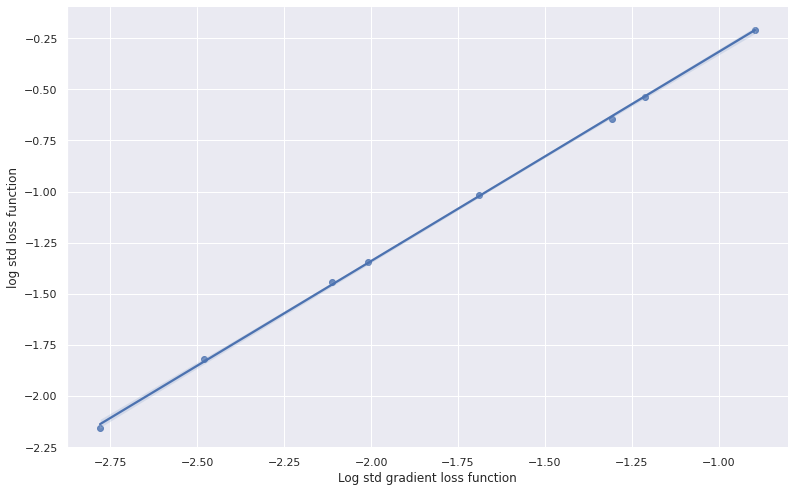

In [50]:
ax = sns.lmplot(x='log_std_gradient_loss', y='log_std_loss', data=df_variance_loss_median, height=7, aspect=1.6)
ax.set(xlabel='Log std gradient loss function', ylabel='log std loss function')
fig.tight_layout()
figname = output_folder + 'std_loss_&_std_gradient_loss_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname)
plt.show()


In [51]:
model = smf.ols(formula='log_std_loss ~ log_std_gradient_loss', data=df_variance_loss_median).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:           log_std_loss   R-squared:                       1.000
Model:                            OLS   Adj. R-squared:                  1.000
Method:                 Least Squares   F-statistic:                 1.875e+04
Date:                Mon, 31 Jul 2023   Prob (F-statistic):           1.02e-11
Time:                        13:36:21   Log-Likelihood:                 24.603
No. Observations:                   8   AIC:                            -45.21
Df Residuals:                       6   BIC:                            -45.05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
Intercept                 0.70

/home/julien/.local/lib/python3.8/site-packages/scipy/stats/stats.py:1541: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=8
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "


---
---

### III.B. Several runs for the same choice of M and N

The coefficients obtained by stochastic gradient descent are stochastic. Take several runs of stochastic gradient to get an expected value for the coefficients.

The number of runs is set by the parameter $nb\_rep$ below.

#### II.B.1. Run for All in One: N=2

In [52]:
M_chosen = 100 #400 #10 #200 # 50 #outer expectation 
N_chosen = 2 #20 #4 # Inner expectation
pre_train_model_chosen = False
nb_epochs_chosen = 1000
order_gauss = 1

params = MyParams(N_chosen, M_chosen, lr_chosen, pre_train_model_chosen, 
                  nb_epochs_chosen, order_gauss, σ_e_chosen, 
                  use_Sobol_chosen, optimizer_chosen)

print("nb epochs: {}".format(params.nb_epochs))
print("W.shape: {}".format(params.W.shape))
print("W_expanded.shape: {}".format(params.W_expanded.shape))
print("M: {}".format(params.M))
print("N: {}".format(params.N))
print("MN: {}".format(params.MN))
print("T: {}".format(params.T))
print("use_Sobol: {}".format(params.use_Sobol))
print("Number nodes Gaussian Q: {}".format(params.nodes.shape))
print("N Gaussian: {}".format(params.N_gaussian))
print("lr: {}".format(params.lr))
print("σ_e: {}".format(params.σ_e))
print("optimizer: {}".format(params.optimizer))

nb epochs: 1000
W.shape: torch.Size([100, 200])
W_expanded.shape: torch.Size([200, 200])
M: 100
N: 2
MN: 200
T: 100
use_Sobol: False
Number nodes Gaussian Q: (1, 2)
N Gaussian: 2
lr: 0.1
σ_e: 0.5
optimizer: SGD


In [53]:
# Calculate variance of loss
# Used below
# params, nb_epoch_opt_M_N, nb_rep, nb_draws_loss, list_M, list_N
nb_iter_model = 200 #1 # nb iterations before calculating the variance (similar to a "burn-in" phase)
nb_rep_model = 20 #number of repetitions of the process: iter model -> calculate variance of loss
nb_draws_var = 500 #number of independent draws to calculate the variance

initial_guess = [2.0, 2.0] #initial guess for the model

# Grid M and grid N
T = (params.M*params.N)/2
grid_N = np.array([N for N in range(2, params.T+2, 2)])
grid_M = 2*T/grid_N

is_int = grid_M % 1 == 0
grid_N = grid_N[is_int]
grid_M = grid_M[is_int]

print(grid_N)
print(grid_M)
print(grid_N*grid_M)

df_variance_loss, df_variance_loss_median = calculate_variance_loss(params, nb_iter_model, 
                                                                    nb_rep_model, nb_draws_var, 
                                                                    grid_M, grid_N, 
                                           norm_chosen = 2.0, freq_accuracy=1000, 
                                          calculate_variance_gradient=True,
                                        initial_guess=initial_guess)

[  2   4   8  10  20  40  50 100]
[100.  50.  25.  20.  10.   5.   4.   2.]
[200. 200. 200. 200. 200. 200. 200. 200.]
Norm chosen: 2.0
Rep 0 / 20. Training a model for 200 Iterations
loss: 3.684210, median percentage euler error 61.948532, [    0/  200]
Rep 0 / 20. Calculting variance loss for 500 Iterations
Rep 0 / 20. Calculting variance norm gradient for 500 Iterations
Rep 1 / 20. Training a model for 200 Iterations
loss: 3.617999, median percentage euler error 61.945969, [    0/  200]
Rep 1 / 20. Calculting variance loss for 500 Iterations
Rep 1 / 20. Calculting variance norm gradient for 500 Iterations
Rep 2 / 20. Training a model for 200 Iterations
loss: 3.448219, median percentage euler error 61.939003, [    0/  200]
Rep 2 / 20. Calculting variance loss for 500 Iterations
Rep 2 / 20. Calculting variance norm gradient for 500 Iterations
Rep 3 / 20. Training a model for 200 Iterations
loss: 3.520123, median percentage euler error 61.940788, [    0/  200]
Rep 3 / 20. Calculting var

In [54]:
%%time
nb_rep = 50
freq_loss_chosen = 10
# Calculate several runs, with similar initial guess
df_AIO, df_AIO_average = calculate_several_runs(params, nb_rep, 
                                                freq_loss = freq_loss_chosen,
                                                initial_guess = initial_guess)

# Create copies
df_AIO_low_uncertainty = df_AIO.copy()
df_AIO_average_low_uncertainty = df_AIO_average.copy() 

Training model : 0 / 50
loss: 3.595746 [    0/ 1000]
Training model : 1 / 50
loss: 3.511658 [    0/ 1000]
Training model : 2 / 50
loss: 3.568812 [    0/ 1000]
Training model : 3 / 50
loss: 3.485496 [    0/ 1000]
Training model : 4 / 50
loss: 3.519805 [    0/ 1000]
Training model : 5 / 50
loss: 3.649903 [    0/ 1000]
Training model : 6 / 50
loss: 3.587544 [    0/ 1000]
Training model : 7 / 50
loss: 3.588336 [    0/ 1000]
Training model : 8 / 50
loss: 3.516695 [    0/ 1000]
Training model : 9 / 50
loss: 3.703940 [    0/ 1000]
Training model : 10 / 50
loss: 3.597713 [    0/ 1000]
Training model : 11 / 50
loss: 3.621633 [    0/ 1000]
Training model : 12 / 50
loss: 3.588710 [    0/ 1000]
Training model : 13 / 50
loss: 3.559683 [    0/ 1000]
Training model : 14 / 50
loss: 3.619512 [    0/ 1000]
Training model : 15 / 50
loss: 3.584376 [    0/ 1000]
Training model : 16 / 50
loss: 3.507506 [    0/ 1000]
Training model : 17 / 50
loss: 3.582051 [    0/ 1000]
Training model : 18 / 50
loss: 3.39673

In [55]:
df_AIO.to_csv(output_folder + 'df_AIO_σ_e' + str(params.σ_e) + '.csv', index=False)
df_AIO_average.to_csv(output_folder + 'df_AIO_average_σ_e' + str(params.σ_e) + '.csv', index=False)

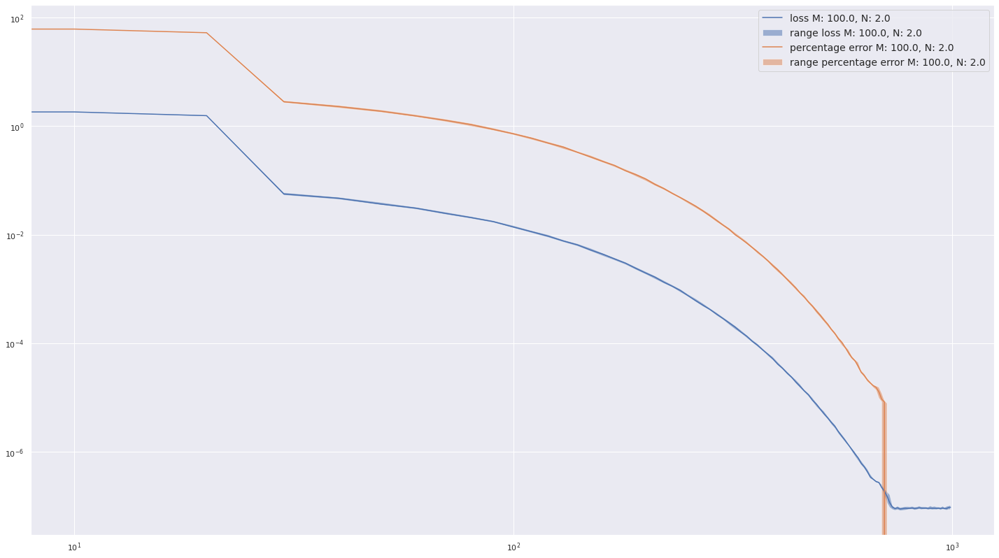

In [56]:
fig, ax = plt.subplots()
ax.plot(df_AIO_average['iter'], df_AIO_average['P50_loss'], label="loss M: {}, N: {}".format(df_AIO_average['M'].values[0], df_AIO_average['N'].values[0]))
ax.fill_between(df_AIO_average['iter'],  df_AIO_average['P25_loss'], df_AIO_average['P75_loss'], label="range loss M: {}, N: {}".format(df_AIO_average['M'].values[0], df_AIO_average['N'].values[0]), alpha=0.5)

ax.plot(df_AIO_average['iter'], df_AIO_average['P50_med_percentage_error'], label="percentage error M: {}, N: {}".format(df_AIO_average['M'].values[0], df_AIO_average['N'].values[0]))
ax.fill_between(df_AIO_average['iter'],  df_AIO_average['P25_med_percentage_error'], df_AIO_average['P75_med_percentage_error'], label="range percentage error M: {}, N: {}".format(df_AIO_average['M'].values[0], df_AIO_average['N'].values[0]), alpha=0.5)

plt.xscale('log')
plt.yscale('log')
plt.legend()
fig.tight_layout()

#### II.B.2. Run for other choice of M and N

In [57]:
M_chosen = 2 #min_M #2 #200 #2 #10 #200 # 50 #outer expectation 
N_chosen = 100 #min_N #400 #4 #400 #20 #4 # Inner expectation

params = MyParams(N_chosen, M_chosen, lr_chosen, pre_train_model_chosen, 
                  nb_epochs_chosen, order_gauss, σ_e_chosen, 
                  use_Sobol_chosen, optimizer_chosen)

print("nb epochs: {}".format(params.nb_epochs))
print("W.shape: {}".format(params.W.shape))
print("W_expanded.shape: {}".format(params.W_expanded.shape))
print("M: {}".format(params.M))
print("N: {}".format(params.N))
print("MN: {}".format(params.MN))
print("T: {}".format(params.T))
print("use_Sobol: {}".format(params.use_Sobol))
print("Number nodes Gaussian Q: {}".format(params.nodes.shape))
print("N Gaussian: {}".format(params.N_gaussian))
print("lr: {}".format(params.lr))
print("σ_e: {}".format(params.σ_e))
print("optimizer: {}".format(params.optimizer))

nb epochs: 1000
W.shape: torch.Size([2, 200])
W_expanded.shape: torch.Size([200, 200])
M: 2
N: 100
MN: 200
T: 100
use_Sobol: False
Number nodes Gaussian Q: (1, 2)
N Gaussian: 2
lr: 0.1
σ_e: 0.5
optimizer: SGD


In [58]:
%%time
df_MC, df_MC_average = calculate_several_runs(params, nb_rep, 
                                              freq_loss = freq_loss_chosen,
                                              initial_guess = initial_guess)

# Create copies
df_MC_low_uncertainty = df_MC.copy()
df_MC_average_low_uncertainty = df_MC_average.copy() 

Training model : 0 / 50
loss: 3.255419 [    0/ 1000]
Training model : 1 / 50
loss: 3.287704 [    0/ 1000]
Training model : 2 / 50
loss: 3.985374 [    0/ 1000]
Training model : 3 / 50
loss: 3.414194 [    0/ 1000]
Training model : 4 / 50
loss: 2.694611 [    0/ 1000]
Training model : 5 / 50
loss: 2.646108 [    0/ 1000]
Training model : 6 / 50
loss: 3.968687 [    0/ 1000]
Training model : 7 / 50
loss: 3.940504 [    0/ 1000]
Training model : 8 / 50
loss: 3.616308 [    0/ 1000]
Training model : 9 / 50
loss: 3.895714 [    0/ 1000]
Training model : 10 / 50
loss: 3.966287 [    0/ 1000]
Training model : 11 / 50
loss: 3.370657 [    0/ 1000]
Training model : 12 / 50
loss: 3.923015 [    0/ 1000]
Training model : 13 / 50
loss: 3.924553 [    0/ 1000]
Training model : 14 / 50
loss: 3.503675 [    0/ 1000]
Training model : 15 / 50
loss: 3.884138 [    0/ 1000]
Training model : 16 / 50
loss: 3.329059 [    0/ 1000]
Training model : 17 / 50
loss: 3.977550 [    0/ 1000]
Training model : 18 / 50
loss: 3.70349

In [59]:
if save_to_csv == True:
    print("Saving to CSV")
    # Save to .csv
    df_MC_low_uncertainty.to_csv(output_folder + 'df_MC_σ_e' + str(params.σ_e) + '.csv', index=False)
    df_MC_average_low_uncertainty.to_csv(output_folder + 'df_MC_average_σ_e' + str(params.σ_e) + '.csv', index=False)
    df_AIO_low_uncertainty.to_csv(output_folder + 'df_AIO_σ_e' + str(params.σ_e) + '.csv', index=False)
    df_AIO_average_low_uncertainty.to_csv(output_folder + 'df_AIO_average_σ_e' + str(params.σ_e) + '.csv', index=False)
if read_from_csv == True:
    print("Reading from CSV")
    # Read from .csv
    df_MC = pd.read_csv(output_folder + 'df_MC_σ_e' + str(params.σ_e) + '.csv')
    df_MC_average = pd.read_csv(output_folder + 'df_MC_average_σ_e' + str(params.σ_e) + '.csv')
    df_AIO = pd.read_csv(output_folder + 'df_AIO_σ_e' + str(params.σ_e) + '.csv')
    df_AIO_average = pd.read_csv(output_folder + 'df_AIO_average_σ_e' + str(params.σ_e) + '.csv')

Saving to CSV


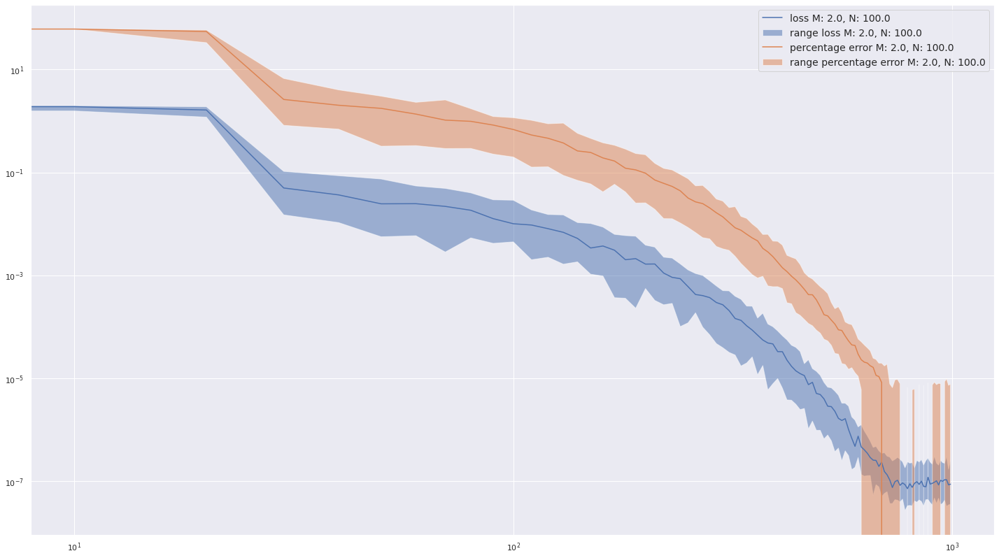

In [60]:
fig, ax = plt.subplots()
ax.plot(df_MC_average['iter'], df_MC_average['P50_loss'], label="loss M: {}, N: {}".format(df_MC_average['M'].values[0], df_MC_average['N'].values[0]))
ax.fill_between(df_MC_average['iter'],  df_MC_average['P10_loss'], df_MC_average['P90_loss'], label="range loss M: {}, N: {}".format(df_MC_average['M'].values[0], df_MC_average['N'].values[0]), alpha=0.5)

ax.plot(df_MC_average['iter'], df_MC_average['P50_med_percentage_error'], label="percentage error M: {}, N: {}".format(df_MC_average['M'].values[0], df_MC_average['N'].values[0]))
ax.fill_between(df_MC_average['iter'],  df_MC_average['P10_med_percentage_error'], df_MC_average['P90_med_percentage_error'], label="range percentage error M: {}, N: {}".format(df_MC_average['M'].values[0], df_MC_average['N'].values[0]), alpha=0.5)

plt.xscale('log')
plt.yscale('log')
plt.legend()
fig.tight_layout()

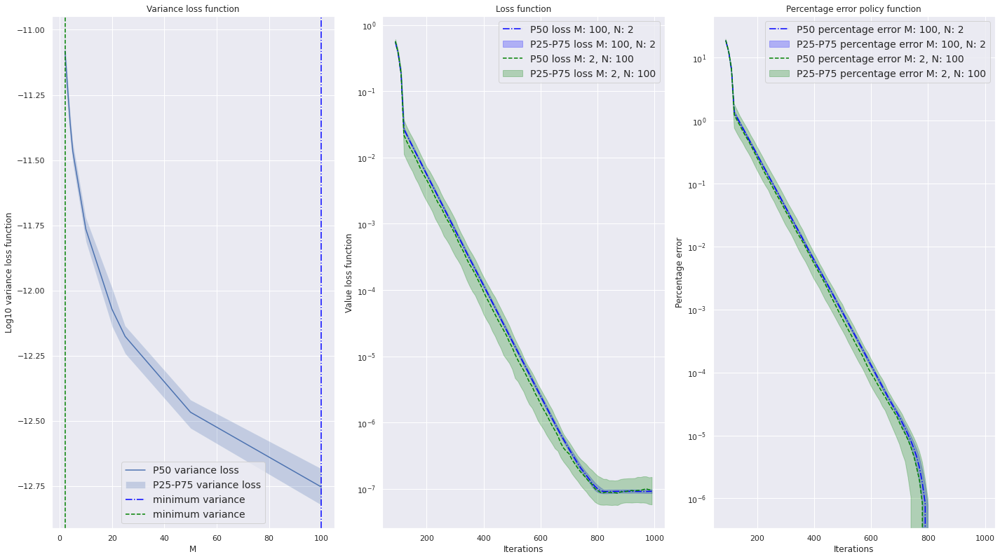

In [61]:
rate = 10
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

# Loss AIO
linestyle_AIO = "-."
linestyle_MC = "--"
color_AIO = "blue"
color_MC = "green"

# Variance loss
ax1.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_var_loss']), label="P50 variance loss")
ax1.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 variance loss", alpha=0.25)
ax1.axvline([params.T], label="minimum variance", linestyle=linestyle_AIO, color=color_AIO)
ax1.axvline([2], label="minimum variance", linestyle=linestyle_MC, color=color_MC)
ax1.set_xlabel("M")
ax1.set_ylabel("Log10 variance loss function")
ax1.set_title('Variance loss function')
ax1.legend()


ax2.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['P50_loss']).rolling(rate).mean(), label="P50 loss M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), linestyle=linestyle_AIO, color=color_AIO)
ax2.fill_between(df_AIO_average['iter'], pd.Series(df_AIO_average['P25_loss']).rolling(rate).mean(), pd.Series(df_AIO_average['P75_loss']).rolling(rate).mean(), label="P25-P75 loss M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), alpha=0.25, color=color_AIO)

# Loss Monte Carlo
ax2.plot(df_MC_average['iter'], pd.Series(df_MC_average['P50_loss']).rolling(rate).mean(), label="P50 loss M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])), linestyle=linestyle_MC, color=color_MC)
ax2.fill_between(df_MC_average['iter'],  pd.Series(df_MC_average['P25_loss']).rolling(rate).mean(), pd.Series(df_MC_average['P75_loss']).rolling(rate).mean(), label="P25-P75 loss M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])), alpha=0.25, color=color_MC)
ax2.set_title('Loss function')
ax2.set_xlabel("Iterations")
ax2.set_ylabel("Value loss function")

ax2.legend()


# Error AIO
ax3.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['P50_med_percentage_error']).rolling(rate).mean(), label="P50 percentage error M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), linestyle=linestyle_AIO, color=color_AIO)
ax3.fill_between(df_AIO_average['iter'],  pd.Series(df_AIO_average['P25_med_percentage_error']).rolling(rate).mean(), pd.Series(df_AIO_average['P75_med_percentage_error']).rolling(rate).mean(), label="P25-P75 percentage error M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), alpha=0.25, color=color_AIO)
# Error MC
ax3.plot(df_MC_average['iter'], pd.Series(df_MC_average['P50_med_percentage_error']).rolling(rate).mean(), label="P50 percentage error M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])), linestyle=linestyle_MC, color=color_MC)
ax3.fill_between(df_MC_average['iter'],  pd.Series(df_MC_average['P25_med_percentage_error']).rolling(rate).mean(), pd.Series(df_MC_average['P75_med_percentage_error']).rolling(rate).mean(), label="P25-P75 percentage error M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])), alpha=0.25, color=color_MC)
ax3.set_xlabel("Iterations")
ax3.set_ylabel("Percentage error")
ax3.set_title('Percentage error policy function')
ax3.legend()

#ax2.set_xscale('log')
ax2.set_yscale('log')
#ax3.set_xscale('log')
ax3.set_yscale('log')

fig.tight_layout()

figname = output_folder + 'AIO_versus_MC_several_runs_2_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname)
plt.show()

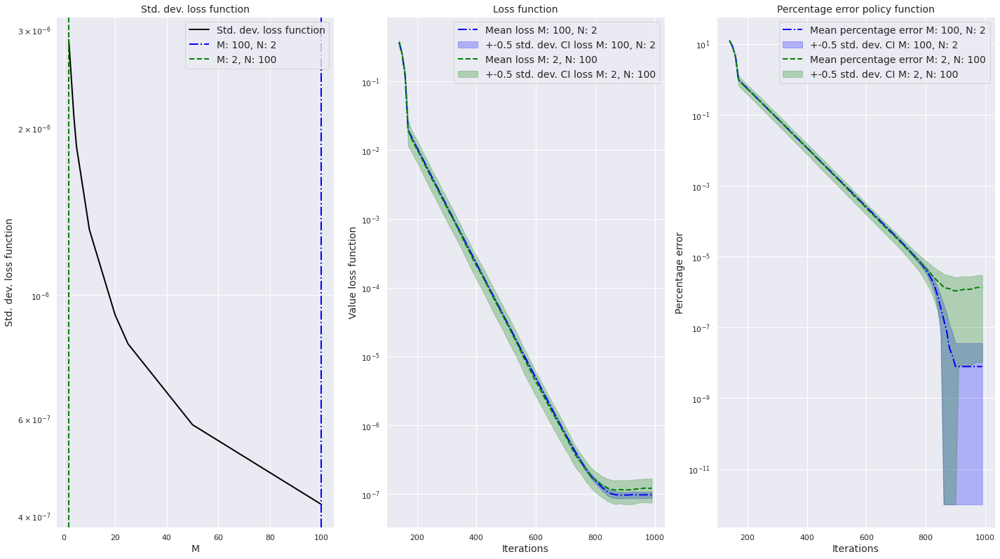

In [62]:
rate_P50 = 15 #rate for the moving average
rate_rolling_stddev = rate_P50 #rate for the stddev.
rate = rate_P50 #rate for the std. bounds
mult_std = 0.5 # standard deviation band
# Get 100% accuracy up to machine precision. It is hard to plot with a log scale.
# So I set the value to machine precision (the real value is 2.220446049250313e-16, but I use 1e-12)
min_val = 1e-12

plt.rcParams['legend.fontsize'] = MEDIUM_SIZE
fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

# Loss AIO
linestyle_AIO = "-."
linestyle_MC = "--"
color_AIO = "blue"
color_MC = "green"

M_AIO = int(df_AIO_average['M'].values[0])
N_AIO = int(df_AIO_average['N'].values[0])

M_MC = int(df_MC_average['M'].values[0])
N_MC = int(df_MC_average['N'].values[0])

# Std. dev. loss
ax1.plot(df_variance_loss_median['M'], df_variance_loss_median['P50_std_loss'], label="Std. dev. loss function", color="black", linewidth=linewidth_chosen)
#ax1.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 variance loss", alpha=0.25)
ax1.axvline([params.T], label="M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO, linewidth=linewidth_chosen)
ax1.axvline([2], label="M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC, linewidth=linewidth_chosen)
ax1.set_xlabel("M", size=MEDIUM_SIZE)
ax1.set_ylabel("Std. dev. loss function", size=MEDIUM_SIZE)
ax1.set_title('Std. dev. loss function', size=MEDIUM_SIZE)
ax1.legend(loc='upper right')

# Loss AIO
std_series = df_AIO_average['std_loss']
ax2.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['loss']).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO, linewidth=linewidth_chosen)
ax2.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Loss Monte Carlo
std_series = df_MC_average['std_loss']
ax2.plot(df_MC_average['iter'], pd.Series(df_MC_average['loss']).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC, linewidth=linewidth_chosen)
ax2.fill_between(df_MC_average['iter'],  pd.Series(np.maximum(df_MC_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)
ax2.set_title('Loss function', size=MEDIUM_SIZE)
ax2.set_xlabel("Iterations", size=MEDIUM_SIZE)
ax2.set_ylabel("Value loss function", size=MEDIUM_SIZE)
ax2.legend()

# Error AIO
mult_std = 0.5

std_series = df_AIO_average['std_med_percentage_error']
AIO_rounded = np.maximum(df_AIO_average['med_percentage_error'], min_val)
ax3.plot(df_AIO_average['iter'], pd.Series(AIO_rounded).rolling(rate_P50).mean(), label="Mean percentage error M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO, linewidth=linewidth_chosen)
ax3.fill_between(df_AIO_average['iter'], pd.Series(np.maximum(AIO_rounded - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(AIO_rounded + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)

# Error MC
std_series = df_MC_average['std_med_percentage_error']
ax3.plot(df_MC_average['iter'], pd.Series(df_MC_average['med_percentage_error']).rolling(rate_P50).mean(), label="Mean percentage error M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC, linewidth=linewidth_chosen)
ax3.fill_between(df_MC_average['iter'], pd.Series(np.maximum(df_MC_average['med_percentage_error'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['med_percentage_error'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)

ax3.set_xlabel("Iterations", size=MEDIUM_SIZE)
ax3.set_ylabel("Percentage error", size=MEDIUM_SIZE)
ax3.set_title('Percentage error policy function', size=MEDIUM_SIZE)
ax3.legend()

ax1.set_yscale('log')
#ax1_bis.set_xscale('log')
#ax2.set_xscale('log')
ax2.set_yscale('log')
#ax3.set_xscale('log')
ax3.set_yscale('log')


fig.tight_layout()

figname = output_folder + 'AIO_versus_MC_several_runs_2_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname, dpi=150)
plt.show()

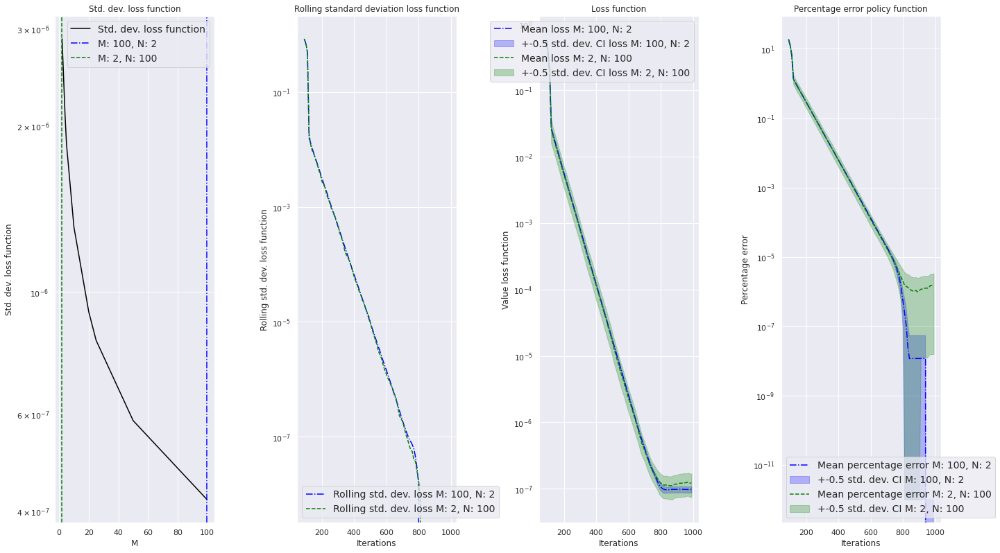

In [63]:
# Use one standard deviation band
rate_P50 = 10 #rate for the average
rate_rolling_stddev = 10 #rate for the stddev.
rate = 10 #rate for the std. bounds
mult_std = 0.5
min_val = 1e-12

fig, (ax1, ax1_bis, ax2, ax3) = plt.subplots(1, 4)

# Loss AIO
linestyle_AIO = "-."
linestyle_MC = "--"
color_AIO = "blue"
color_MC = "green"

M_AIO = int(df_AIO_average['M'].values[0])
N_AIO = int(df_AIO_average['N'].values[0])

M_MC = int(df_MC_average['M'].values[0])
N_MC = int(df_MC_average['N'].values[0])

# Variance loss
ax1.plot(df_variance_loss_median['M'], df_variance_loss_median['P50_std_loss'], label="Std. dev. loss function", color="black")
#ax1.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 variance loss", alpha=0.25)
ax1.axvline([params.T], label="M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO)
ax1.axvline([2], label="M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC)
ax1.set_xlabel("M")
ax1.set_ylabel("Std. dev. loss function")
ax1.set_title('Std. dev. loss function')
ax1.legend(loc='upper right')

# Trailing std. dev
ax1_bis.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['loss']).rolling(rate_rolling_stddev).std(), label="Rolling std. dev. loss M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO)
#ax1_bis.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Loss Monte Carlo
ax1_bis.plot(df_MC_average['iter'], pd.Series(df_MC_average['loss']).rolling(rate_rolling_stddev).std(), label="Rolling std. dev. loss M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC)
#ax1_bis.fill_between(df_MC_average['iter'],  pd.Series(np.maximum(df_MC_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)
ax1_bis.set_title('Rolling standard deviation loss function')
ax1_bis.set_xlabel("Iterations")
ax1_bis.set_ylabel("Rolling std. dev. loss function")
ax1_bis.legend()


# Loss AIO
std_series = df_AIO_average['std_loss']
ax2.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['loss']).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO)
ax2.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Loss Monte Carlo
std_series = df_MC_average['std_loss']
ax2.plot(df_MC_average['iter'], pd.Series(df_MC_average['loss']).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC)
ax2.fill_between(df_MC_average['iter'],  pd.Series(np.maximum(df_MC_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)
ax2.set_title('Loss function')
ax2.set_xlabel("Iterations")
ax2.set_ylabel("Value loss function")
ax2.legend()


# Error AIO
#rate_P50 = 10
#rate = 10
mult_std = 0.5
#min_val = 1e-12

std_series = df_AIO_average['std_med_percentage_error']
ax3.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['med_percentage_error']).rolling(rate_P50).mean(), label="Mean percentage error M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO)
ax3.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['med_percentage_error'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['med_percentage_error'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Error MC
std_series = df_MC_average['std_med_percentage_error']
ax3.plot(df_MC_average['iter'], pd.Series(df_MC_average['med_percentage_error']).rolling(rate_P50).mean(), label="Mean percentage error M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC)
ax3.fill_between(df_MC_average['iter'], pd.Series(np.maximum(df_MC_average['med_percentage_error'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['med_percentage_error'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)

ax3.set_xlabel("Iterations")
ax3.set_ylabel("Percentage error")
ax3.set_title('Percentage error policy function')
ax3.legend()

ax1.set_yscale('log')
#ax1_bis.set_xscale('log')
ax1_bis.set_yscale('log')
#ax2.set_xscale('log')
ax2.set_yscale('log')
#ax3.set_xscale('log')
ax3.set_yscale('log')


fig.tight_layout()

figname = output_folder + 'AIO_versus_MC_several_runs_2_trailing_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname)
plt.show()

In [64]:
rate_P50 = 10
rate = 10
mult_std = 1.0
min_val = 1e-12

last_loss_AIO = pd.Series(df_AIO_average['loss']).rolling(rate).mean().values[-1]
last_loss_MC = pd.Series(df_MC_average['loss']).rolling(rate).mean().values[-1]

print("------------------")
print("Comparing levels")
print("Final loss AIO: {}".format(last_loss_AIO))
print("Final loss MC: {}".format(last_loss_MC))
print("% difference: {}".format(100*(last_loss_AIO/last_loss_MC - 1.0)))

last_loss_AIO = pd.Series(df_AIO_average['med_percentage_error']).rolling(rate).mean().values[-1]
last_loss_MC = pd.Series(df_MC_average['med_percentage_error']).rolling(rate).mean().values[-1]

print("Med % error AIO: {}".format(last_loss_AIO))
print("Med % error MC: {}".format(last_loss_MC))
print("% difference: {}".format(100*(last_loss_AIO/last_loss_MC - 1.0)))

print("------------------")
print("Comparing std deviations")
last_loss_AIO = df_AIO_average['std_loss'].values[-1]
last_loss_MC = df_MC_average['std_loss'].values[-1]

print("Final std dev. loss AIO: {}".format(last_loss_AIO))
print("Final std dev.  loss MC: {}".format(last_loss_MC))
print("% difference: {}".format(100*(last_loss_AIO/last_loss_MC - 1.0)))

last_loss_AIO = df_AIO_average['med_percentage_error'].values[-1]
last_loss_MC = df_MC_average['med_percentage_error'].values[-1]

print("Final std dev. euler error AIO: {}".format(last_loss_AIO))
print("Final std dev. euler error MC: {}".format(last_loss_MC))
print("% difference: {}".format(100*(last_loss_AIO/last_loss_MC - 1.0)))

------------------
Comparing levels
Final loss AIO: 9.746661865823797e-08
Final loss MC: 1.21351915868906e-07
% difference: -19.682670058930785
Med % error AIO: 0.0
Med % error MC: 1.5788921928105992e-06
% difference: -100.0
------------------
Comparing std deviations
Final std dev. loss AIO: 1.7826052867165716e-08
Final std dev.  loss MC: 9.600403112148508e-08
% difference: -81.43197461718212
Final std dev. euler error AIO: 0.0
Final std dev. euler error MC: 1.3985516034153989e-06
% difference: -100.0


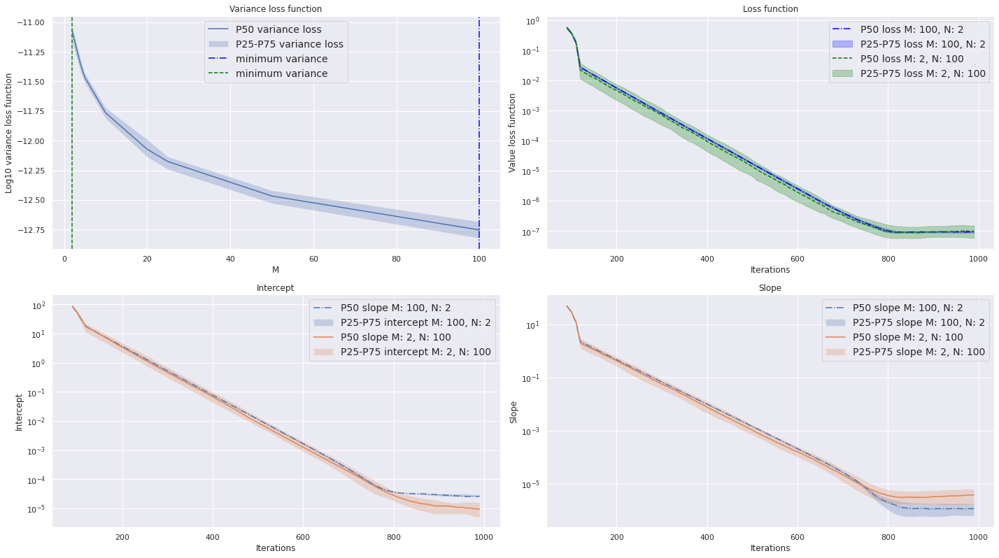

In [65]:
# Plot coefficients 
rate = 10
fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

# Loss AIO
linestyle_AIO = "-."
linestyle_MC = "--"
color_AIO = "blue"
color_MC = "green"

# Variance loss
ax1.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_var_loss']), label="P50 variance loss")
ax1.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 variance loss", alpha=0.25)
ax1.axvline([params.T], label="minimum variance", linestyle=linestyle_AIO, color=color_AIO)
ax1.axvline([2], label="minimum variance", linestyle=linestyle_MC, color=color_MC)
ax1.set_xlabel("M")
ax1.set_ylabel("Log10 variance loss function")
ax1.set_title('Variance loss function')
ax1.legend()


ax2.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['P50_loss']).rolling(rate).mean(), label="P50 loss M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), linestyle=linestyle_AIO, color=color_AIO)
ax2.fill_between(df_AIO_average['iter'], pd.Series(df_AIO_average['P25_loss']).rolling(rate).mean(), pd.Series(df_AIO_average['P75_loss']).rolling(rate).mean(), label="P25-P75 loss M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), alpha=0.25, color=color_AIO)

# Loss Monte Carlo
ax2.plot(df_MC_average['iter'], pd.Series(df_MC_average['P50_loss']).rolling(rate).mean(), label="P50 loss M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])), linestyle=linestyle_MC, color=color_MC)
ax2.fill_between(df_MC_average['iter'],  pd.Series(df_MC_average['P25_loss']).rolling(rate).mean(), pd.Series(df_MC_average['P75_loss']).rolling(rate).mean(), label="P25-P75 loss M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])), alpha=0.25, color=color_MC)
ax2.set_title('Loss function')
ax2.set_xlabel("Iterations")
ax2.set_ylabel("Value loss function")
ax2.legend()

# Intercept AIO
rate = 10
ax3.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['P50_abs_perc_dev_bias']).rolling(rate).mean(), label="P50 slope M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), linestyle=linestyle_AIO)
ax3.fill_between(df_AIO_average['iter'],  pd.Series(df_AIO_average['P25_abs_perc_dev_bias']).rolling(rate).mean(), pd.Series(df_AIO_average['P75_abs_perc_dev_bias']).rolling(rate).mean(), label="P25-P75 intercept M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), alpha=0.25)
# Slope MC
ax3.plot(df_MC_average['iter'], pd.Series(df_MC_average['P50_abs_perc_dev_bias']).rolling(rate).mean(), label="P50 slope M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])))
ax3.fill_between(df_MC_average['iter'],  pd.Series(df_MC_average['P25_abs_perc_dev_bias']).rolling(rate).mean(), pd.Series(df_MC_average['P75_abs_perc_dev_bias']).rolling(rate).mean(), label="P25-P75 intercept M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])), alpha=0.25)
ax3.set_xlabel("Iterations")
ax3.set_ylabel("Intercept")
ax3.set_title('Intercept')
ax3.legend()

# Slope AIO
ax4.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['P50_abs_perc_dev_weight']).rolling(rate).mean(), label="P50 slope M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), linestyle=linestyle_AIO)
ax4.fill_between(df_AIO_average['iter'],  pd.Series(df_AIO_average['P25_abs_perc_dev_weight']).rolling(rate).mean(), pd.Series(df_AIO_average['P75_abs_perc_dev_weight']).rolling(rate).mean(), label="P25-P75 slope M: {}, N: {}".format(int(df_AIO_average['M'].values[0]), int(df_AIO_average['N'].values[0])), alpha=0.25)
# Slope MC
ax4.plot(df_MC_average['iter'], pd.Series(df_MC_average['P50_abs_perc_dev_weight']).rolling(rate).mean(), label="P50 slope M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])))
ax4.fill_between(df_MC_average['iter'],  pd.Series(df_MC_average['P25_abs_perc_dev_weight']).rolling(rate).mean(), pd.Series(df_MC_average['P75_abs_perc_dev_weight']).rolling(rate).mean(), label="P25-P75 slope M: {}, N: {}".format(int(df_MC_average['M'].values[0]), int(df_MC_average['N'].values[0])), alpha=0.25)
ax4.set_xlabel("Iterations")
ax4.set_ylabel("Slope")
ax4.set_title('Slope')
ax4.legend()

#ax2.set_xscale('log')
ax2.set_yscale('log')
#ax3.set_xscale('log')
ax3.set_yscale('log')
#ax4.set_xscale('log')
ax4.set_yscale('log')

fig.tight_layout()

figname = output_folder + 'AIO_versus_MC_several_runs_2_coeffs_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname)
plt.show()

### Predictive power of variance loss/gradient

Same as above, but choose a fix combination of M and N. 
See how the variance of the loss or gradient is predictive for the quality of fit.

In [66]:
M_chosen = 100 # Outer expectation 
N_chosen = 2 # Inner expectation
lr_chosen = 1e-1 # learning rate
pre_train_model_chosen = False
nb_epochs_chosen = 1000 #number of epochs training
order_gauss = 1
σ_e_chosen = 0.5 #std deviation of shocks
use_Sobol_chosen = True #use Sobol sampling in the state space
params = MyParams(N_chosen, M_chosen, lr_chosen, pre_train_model_chosen, 
                  nb_epochs_chosen, order_gauss, σ_e_chosen, 
                  use_Sobol_chosen, optimizer_chosen)

print("nb epochs: {}".format(params.nb_epochs))
print("W.shape: {}".format(params.W.shape))
print("W_expanded.shape: {}".format(params.W_expanded.shape))
print("M: {}".format(params.M))
print("N: {}".format(params.N))
print("MN: {}".format(params.MN))
print("T: {}".format(params.T))
print("use_Sobol: {}".format(params.use_Sobol))
print("Number nodes Gaussian Q: {}".format(params.nodes.shape))
print("N Gaussian: {}".format(params.N_gaussian))
print("lr: {}".format(params.lr))
print("σ_e: {}".format(params.σ_e))

T = (params.M*params.N)/2
#grid_N = np.concatenate((np.ones(1), np.array([N for N in range(2, 200+2, 2)])))
grid_N = np.array([N for N in range(2, params.T+2, 2)])
grid_M = 2*T/grid_N

is_int = grid_M % 1 == 0
grid_N = grid_N[is_int]
grid_M = grid_M[is_int]

print(grid_N)
print(grid_M)
print(grid_N*grid_M)

# Criterion for optimal M and N
criterion_best_M =  "min_var" #"min_var_grad" #"min_var" #"min_var_grad" #"min_var"

nb epochs: 1000
W.shape: torch.Size([100, 200])
W_expanded.shape: torch.Size([200, 200])
M: 100
N: 2
MN: 200
T: 100
use_Sobol: True
Number nodes Gaussian Q: (1, 2)
N Gaussian: 2
lr: 0.1
σ_e: 0.5
[  2   4   8  10  20  40  50 100]
[100.  50.  25.  20.  10.   5.   4.   2.]
[200. 200. 200. 200. 200. 200. 200. 200.]


In [67]:
%%time
do_predicted_experiment = False

if do_predicted_experiment == True:
    plot_scale = 1.25
    plt.rcParams["figure.figsize"] = (plot_scale*16, plot_scale*9)
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

    list_lr_to_try = [0.1]
    list_optimizer_to_try = ["SGD"]
    list_sigma_e_to_try = [1.5, 1.0, 0.5]
    # To do vary x_min and x_max

    # to store the dataframe on variance
    df_variance_loss_final = pd.DataFrame()
    df_variance_loss_median_final = pd.DataFrame()

    # to store the dataframe on MC
    df_MC_final_1 = pd.DataFrame()
    df_MC_average_final_1 = pd.DataFrame()
    df_MC_final_2 = pd.DataFrame()
    df_MC_average_final_2 = pd.DataFrame()
    df_MC_final_3 = pd.DataFrame()
    df_MC_average_final_3 = pd.DataFrame()


    # Parameters for the calculation of the optimal M and N
    nb_iter_var = 200 #gradient descent steps before calculating variance of loss
    nb_rep_var = 1 #number of replication of the process
    nb_draws_var = 500 #number of draws to calculate the variance
    print("grid_M: {}.".format(grid_M))
    print("grid_N: {}.".format(grid_N))

    nb_rep = 20 #number of independent trainings, holding M and N cst
    index=0
    max_index = len(list_lr_to_try)*len(list_optimizer_to_try )*len(list_sigma_e_to_try)

    # Fix 3 points
    M_1, N_1 = 100, 2
    M_2, N_2 = 20, 10
    M_3, N_3 = 2, 100

    for (index_lr, lr_chosen) in tqdm(enumerate(list_lr_to_try)):
        for (index_optimizer, optimizer_chosen) in enumerate(list_optimizer_to_try):
            for (index_σ_e, σ_e_chosen) in enumerate(list_sigma_e_to_try):
                print("--------------------------------------------------")
                print("Global Iteration {} / {}".format(index, max_index))
                print("--------------------------------------------------")
                print("lr: {}".format(lr_chosen))
                print("optimizer: {}".format(optimizer_chosen))
                print("σ_e: {}".format(σ_e_chosen))

                index+=1

                params_local = MyParams(params.N, params.M, lr_chosen, params.pre_train_model, 
                      params.nb_epochs, params.order_gauss, σ_e_chosen, params.use_Sobol, optimizer_chosen)

                # A. Find optimal choice of M and N
                # params, nb_epoch_opt_M_N, nb_rep, nb_draws_loss, list_M, list_N
                df_variance_loss, df_variance_loss_median = calculate_variance_loss(params_local, nb_iter_var, 
                                                                                    nb_rep_var, nb_draws_var, 
                                                                                    grid_M, grid_N, norm_chosen = 2.0,
                                                           freq_accuracy=1000, calculate_variance_gradient=True,
                                                           initial_guess = initial_guess)

                df_variance_loss_median['optimizer'] = params.optimizer
                df_variance_loss_median['sigma_e'] = params.σ_e
                df_variance_loss_median['Sobol'] = params.use_Sobol
                df_variance_loss_median['user_scheduler'] = params.use_scheduler
                df_variance_loss_median['lr'] = params.lr
                df_variance_loss_median['log10_variance_loss'] = np.log10(df_variance_loss_median['P50_var_loss'])
                df_variance_loss_median['log10_variance_gradient_loss'] = np.log10(df_variance_loss_median['P50_var_gradient_loss'])

                # M and N corresponding to minimum variance
                min_var = np.min(df_variance_loss_median['P50_var_loss'])
                min_M = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['M'])
                min_N = int(df_variance_loss_median[df_variance_loss_median['P50_var_loss'] == min_var]['N'])

                try:
                    min_var_grad = np.min(df_variance_loss_median['P50_var_gradient_loss'])
                    min_M_grad = int(df_variance_loss_median[df_variance_loss_median['P50_var_gradient_loss'] == min_var_grad]['M'])
                    min_N_grad = int(df_variance_loss_median[df_variance_loss_median['P50_var_gradient_loss'] == min_var_grad]['N'])
                except:
                    print("error M and N var gradient")

                #init
                optimal_M = 0
                optimal_N = 0
                if criterion_best_M == "min_var":
                    optimal_M = min_M
                    optimal_N = min_N
                else:
                    optimal_M = min_M_grad
                    optimal_N = min_N_grad

                # Plot
                fig, ((ax1, ax2), (ax3, ax4)) = plt.subplots(2, 2)

                ax1.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_var_loss']), label="median variance loss")
                ax1.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 variance loss", alpha=0.25)
                ax1.axvline(min_M, label="minimum variance", linestyle="--")
                ax1.set_xlabel("M")
                ax1.set_ylabel("Log10 variance loss function")
                ax1.set_title('Variance loss function')
                ax1.legend()

                ax2.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_mean_loss']), label="median mean loss")
                ax2.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_mean_loss']), np.log10(df_variance_loss_median['P75_mean_loss']), label="P25-P75 mean loss", alpha=0.25)
                ax2.set_xlabel("M")
                ax2.set_ylabel("Log10 mean loss function")
                ax2.set_title('Mean loss function')
                ax2.legend()

                ax3.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_var_gradient_loss']), label="median variance loss")
                ax3.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_gradient_loss']), np.log10(df_variance_loss_median['P75_var_gradient_loss']), label="P25-P75 variance loss", alpha=0.25)
                ax3.axvline(min_M_grad, label="minimum gradient variance", linestyle="--")
                ax3.set_xlabel("M")
                ax3.set_ylabel("Log10 variance gradient loss function")
                ax3.set_title('Variance gradient loss function')
                ax3.legend()

                ax4.plot(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P50_mean_gradient_loss']), label="median mean gradient loss")
                ax4.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_mean_gradient_loss']), np.log10(df_variance_loss_median['P75_mean_gradient_loss']), label="P25-P75 mean gradient loss", alpha=0.25)
                ax4.set_xlabel("M")
                ax4.set_ylabel("Log10 mean gradient loss function")
                ax4.set_title('Mean gradient loss function')
                ax4.legend()

                fig.tight_layout()
                figname = output_folder + '/hyperparameter2/variance_loss_index' + str(index) + '.png'
                plt.savefig(figname)
                plt.close()

                print("criterion_best_M: {}".format(criterion_best_M))
                print("Optimal M: {}".format(optimal_M))
                print("Optimal N: {}".format(optimal_N))

                # B. Several runs of M_min
                params_MC = MyParams(N_1, M_1, lr_chosen, params.pre_train_model, 
                      params.nb_epochs, params.order_gauss, σ_e_chosen, params.use_Sobol, optimizer_chosen)

                df_MC_1, df_MC_average_1 = calculate_several_runs(params_MC, nb_rep, freq_loss = 1, initial_guess = initial_guess)

                # C. Several runs for M_middle
                params_MC = MyParams(N_2, M_2, lr_chosen, params.pre_train_model, 
                      params.nb_epochs, params.order_gauss, σ_e_chosen, params.use_Sobol, optimizer_chosen)

                df_MC_2, df_MC_average_2 = calculate_several_runs(params_MC, nb_rep, freq_loss = 1, initial_guess = initial_guess)

                # D. Several runs for M_max
                params_MC = MyParams(N_3, M_3, lr_chosen, params.pre_train_model, 
                      params.nb_epochs, params.order_gauss, σ_e_chosen, params.use_Sobol, optimizer_chosen)

                df_MC_3, df_MC_average_3 = calculate_several_runs(params_MC, nb_rep, freq_loss = 1, initial_guess = initial_guess)

                rate = 10
                fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

                # Variance loss
                linestyle_1 = "-."
                linestyle_2 = "dotted"
                linestyle_3 = "solid"
                # Colors
                color_1 = "blue"
                color_2 = "red"
                color_3 = "green"

                if criterion_best_M == "min_var":
                    ax1.plot(df_variance_loss_median['M'], df_variance_loss_median['P50_var_loss'])
                    ax1.fill_between(df_variance_loss_median['M'], df_variance_loss_median['P25_var_loss'], df_variance_loss_median['P75_var_loss'], alpha=0.25)
                    ax1.axvline(M_1, linestyle=linestyle_1, label="M: {}, N: {}".format(M_1, N_1), color = color_1)
                    ax1.axvline(M_2, linestyle=linestyle_2, label="M: {}, N: {}".format(M_2, N_2), color = color_2)
                    ax1.axvline(M_3, linestyle=linestyle_3, label="M: {}, N: {}".format(M_3, N_3), color = color_3)
                    ax1.set_xlabel("M")
                    ax1.set_ylabel("Log10 variance loss function")
                    ax1.set_title('Variance loss function')
                    ax1.legend()
                # Variance norm gradient
                else:
                    ax1.plot(df_variance_loss_median['M'], df_variance_loss_median['P50_var_gradient_loss'])
                    ax1.fill_between(df_variance_loss_median['M'], df_variance_loss_median['P25_var_gradient_loss'], df_variance_loss_median['P75_var_gradient_loss'], alpha=0.25)
                    ax1.axvline(M_1, linestyle=linestyle_1, label="M: {}, N: {}".format(M_1, N_1), color = color_1)
                    ax1.axvline(M_2, linestyle=linestyle_2, label="M: {}, N: {}".format(M_2, N_2), color = color_2)
                    ax1.axvline(M_3, linestyle=linestyle_3, label="M: {}, N: {}".format(M_3, N_3), color = color_3)
                    ax1.set_xlabel("M")
                    ax1.set_ylabel("Log10 variance gradient loss function")
                    ax1.set_title('Variance gradient loss function')
                    ax1.legend()

                # Use one standard deviation band
                rate_P50 = 10
                rate = 10
                mult_std = 1.0
                min_val = 1e-12

                # Losses
                ## Loss 1
                var_name = "loss"
                std_series = df_MC_average_1['std_' + var_name]
                ax2.plot(df_MC_average_1['iter'], pd.Series(df_MC_average_1[var_name]).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_1, N_1), linestyle=linestyle_1, color=color_1)
                ax2.fill_between(df_MC_average_1['iter'],  pd.Series(np.maximum(df_MC_average_1[var_name] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average_1[var_name] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_1, N_1), alpha=0.25, color=color_1)
                # Loss 2
                std_series = df_MC_average_2['std_' + var_name]
                ax2.plot(df_MC_average_2['iter'], pd.Series(df_MC_average_2[var_name]).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_2, N_2), linestyle=linestyle_2, color=color_2)
                ax2.fill_between(df_MC_average_2['iter'],  pd.Series(np.maximum(df_MC_average_2[var_name] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average_2[var_name] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_2, N_2), alpha=0.25, color=color_2)
                # Loss 3
                std_series = df_MC_average_3['std_' + var_name]
                ax2.plot(df_MC_average_3['iter'], pd.Series(df_MC_average_3[var_name]).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_3, N_3), linestyle=linestyle_3, color=color_3)
                ax2.fill_between(df_MC_average_3['iter'],  pd.Series(np.maximum(df_MC_average_3[var_name] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average_3[var_name] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_3, N_3), alpha=0.25, color=color_3)

                ax2.set_title('Loss function')
                ax2.set_xlabel("Iterations")
                ax2.set_ylabel("Value loss function")
                ax2.legend()

                # Use 1/2 standard deviation band
                mult_std = 0.5

                var_name = "med_percentage_error"
                std_series = df_MC_average_1['std_' + var_name]
                ax3.plot(df_MC_average_1['iter'], pd.Series(df_MC_average_1[var_name]).rolling(rate).mean(), label="Mean percentage error M: {}, N: {}".format(M_1, N_1), linestyle=linestyle_1, color=color_1)
                ax3.fill_between(df_MC_average_1['iter'],  pd.Series(np.maximum(df_MC_average_1[var_name] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average_1[var_name] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_1, N_1), alpha=0.25, color=color_1)
                # Loss 2
                std_series = df_MC_average_2['std_' + var_name]
                ax3.plot(df_MC_average_2['iter'], pd.Series(df_MC_average_2[var_name]).rolling(rate).mean(), label="Mean percentage error M: {}, N: {}".format(M_2, N_2), linestyle=linestyle_2, color=color_2)
                ax3.fill_between(df_MC_average_2['iter'],  pd.Series(np.maximum(df_MC_average_2[var_name] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average_2[var_name] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_2, N_2), alpha=0.25, color=color_2)
                # Loss 3
                std_series = df_MC_average_3['std_' + var_name]
                ax3.plot(df_MC_average_3['iter'], pd.Series(df_MC_average_3[var_name]).rolling(rate).mean(), label="Mean percentage error M: {}, N: {}".format(M_3, N_3), linestyle=linestyle_3, color=color_3)
                ax3.fill_between(df_MC_average_3['iter'],  pd.Series(np.maximum(df_MC_average_3[var_name] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average_3[var_name] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_3, N_3), alpha=0.25, color=color_3)

                ax3.set_xlabel("Iterations")
                ax3.set_ylabel("Percentage error")
                ax3.set_title('Percentage error policy function')
                ax3.legend()

                ax1.set_yscale('log')
                #ax2.set_xscale('log')
                ax2.set_yscale('log')
                #ax3.set_xscale('log')
                ax3.set_yscale('log')
                fig.tight_layout()

                figname = output_folder + '/hyperparameter2/AIO_versus_MC_several_runs_2_index' + str(index) + '.png'
                plt.savefig(figname)
                plt.close()

                # D. Store results
                if index == 1:
                    df_variance_loss_median_final = df_variance_loss_median
                    df_variance_loss_final = df_variance_loss

                    df_MC_final_1 = df_MC_1
                    df_MC_average_final_1 = df_MC_average_1
                    df_MC_final_2 = df_MC_2
                    df_MC_average_final_2 = df_MC_average_2
                    df_MC_final_3 = df_MC_3
                    df_MC_average_final_3 = df_MC_average_3

                else:
                    df_variance_loss_median_final = pd.concat([df_variance_loss_median_final, df_variance_loss_median])
                    df_variance_loss_final = pd.concat([df_variance_loss_final, df_variance_loss])

                    df_MC_final_1 = pd.concat([df_MC_final_1 , df_MC_1])
                    df_MC_average_final_1 = pd.concat([df_MC_average_final_1, df_MC_average_1])
                    df_MC_final_2 = pd.concat([df_MC_final_2, df_MC_2])
                    df_MC_average_final_2 = pd.concat([df_MC_average_final_2 , df_MC_average_2])
                    df_MC_final_3 = pd.concat([df_MC_final_3, df_MC_3])
                    df_MC_average_final_3 = pd.concat([df_MC_average_final_3, df_MC_average_3])


CPU times: user 5 µs, sys: 0 ns, total: 5 µs
Wall time: 7.87 µs


---
---

## IV. Optimal choice of hyperparameters M and N: high uncertainty

I increase the variance of the innovation shocks ($σ\_e\_chosen$) and I follow the same steps as in section III.

### Params

In [68]:
M_chosen = 100 # Outer expectation 
N_chosen = 2 # Inner expectation
lr_chosen = 1e-1 ## learning rate
pre_train_model_chosen = False
nb_epochs_chosen = 1000
order_gauss = 1
σ_e_chosen = 1.5 #std deviation of shocks
use_Sobol_chosen = False #use Sobol sampling in the state space
optimizer_chosen = "SGD"

params = MyParams(N_chosen, M_chosen, lr_chosen, pre_train_model_chosen, 
                  nb_epochs_chosen, order_gauss, σ_e_chosen, use_Sobol_chosen, optimizer_chosen)

print("nb epochs: {}".format(params.nb_epochs))
print("W.shape: {}".format(params.W.shape))
print("W_expanded.shape: {}".format(params.W_expanded.shape))
print("M: {}".format(params.M))
print("N: {}".format(params.N))
print("MN: {}".format(params.MN))
print("T: {}".format(params.T))
print("use_Sobol: {}".format(params.use_Sobol))
print("Number nodes Gaussian Q: {}".format(params.nodes.shape))
print("N Gaussian: {}".format(params.N_gaussian))
print("lr: {}".format(params.lr))
print("σ_e: {}".format(params.σ_e))
print("optimizer: {}".format(params.optimizer))
print("Initial guess: {}".format(initial_guess))

# Calculate variance of loss
# Used below
# params, nb_epoch_opt_M_N, nb_rep, nb_draws_loss, list_M, list_N
nb_iter_model = 200 # nb iterations before calculating the variance
nb_rep_model = 20 #number of repetitions of the process: iter model -> calculate variance of loss
nb_draws_var = 500 #number of independent draws to calculate the variance
initial_guess = [2.0, 2.0] #initial guess for the model

# Grid M and grid N
T = (params.M*params.N)/2
#grid_N = np.concatenate((np.ones(1), np.array([N for N in range(2, 200+2, 2)])))
grid_N = np.array([N for N in range(2, params.T+2, 2)])
grid_M = 2*T/grid_N

is_int = grid_M % 1 == 0
grid_N = grid_N[is_int]
grid_M = grid_M[is_int]

print(grid_N)
print(grid_M)
print(grid_N*grid_M)

nb epochs: 1000
W.shape: torch.Size([100, 200])
W_expanded.shape: torch.Size([200, 200])
M: 100
N: 2
MN: 200
T: 100
use_Sobol: False
Number nodes Gaussian Q: (1, 2)
N Gaussian: 2
lr: 0.1
σ_e: 1.5
optimizer: SGD
Initial guess: [2.0, 2.0]
[  2   4   8  10  20  40  50 100]
[100.  50.  25.  20.  10.   5.   4.   2.]
[200. 200. 200. 200. 200. 200. 200. 200.]


### Variance loss

In [69]:
df_variance_loss, df_variance_loss_median = calculate_variance_loss(params, nb_iter_model, 
                                                                    nb_rep_model, nb_draws_var, 
                                                                    grid_M, grid_N, 
                                           norm_chosen = 2.0, freq_accuracy=1000, 
                                          calculate_variance_gradient=True,
                                        initial_guess=initial_guess)

Norm chosen: 2.0
Rep 0 / 20. Training a model for 200 Iterations
loss: 3.638591, median percentage euler error 61.945862, [    0/  200]
Rep 0 / 20. Calculting variance loss for 500 Iterations
Rep 0 / 20. Calculting variance norm gradient for 500 Iterations
Rep 1 / 20. Training a model for 200 Iterations
loss: 3.528263, median percentage euler error 61.941090, [    0/  200]
Rep 1 / 20. Calculting variance loss for 500 Iterations
Rep 1 / 20. Calculting variance norm gradient for 500 Iterations
Rep 2 / 20. Training a model for 200 Iterations
loss: 3.528072, median percentage euler error 61.941292, [    0/  200]
Rep 2 / 20. Calculting variance loss for 500 Iterations
Rep 2 / 20. Calculting variance norm gradient for 500 Iterations
Rep 3 / 20. Training a model for 200 Iterations
loss: 3.602277, median percentage euler error 61.945396, [    0/  200]
Rep 3 / 20. Calculting variance loss for 500 Iterations
Rep 3 / 20. Calculting variance norm gradient for 500 Iterations
Rep 4 / 20. Training a 

### Several runs AIO

In [70]:
%%time
nb_rep = 50
freq_loss_chosen = 10
# Calculate several runs, with similar initial guess
df_AIO, df_AIO_average = calculate_several_runs(params, nb_rep, 
                                                freq_loss = freq_loss_chosen,
                                               initial_guess = initial_guess)

# Create copies
df_AIO_high_uncertainty = df_AIO.copy()
df_AIO_average_high_uncertainty = df_AIO_average.copy() 

Training model : 0 / 50
loss: 3.579054 [    0/ 1000]
Training model : 1 / 50
loss: 3.548719 [    0/ 1000]
Training model : 2 / 50
loss: 3.630916 [    0/ 1000]
Training model : 3 / 50
loss: 3.554008 [    0/ 1000]
Training model : 4 / 50
loss: 3.589142 [    0/ 1000]
Training model : 5 / 50
loss: 3.497749 [    0/ 1000]
Training model : 6 / 50
loss: 3.562031 [    0/ 1000]
Training model : 7 / 50
loss: 3.582232 [    0/ 1000]
Training model : 8 / 50
loss: 3.622972 [    0/ 1000]
Training model : 9 / 50
loss: 3.472090 [    0/ 1000]
Training model : 10 / 50
loss: 3.463152 [    0/ 1000]
Training model : 11 / 50
loss: 3.636057 [    0/ 1000]
Training model : 12 / 50
loss: 3.625034 [    0/ 1000]
Training model : 13 / 50
loss: 3.510144 [    0/ 1000]
Training model : 14 / 50
loss: 3.525994 [    0/ 1000]
Training model : 15 / 50
loss: 3.495519 [    0/ 1000]
Training model : 16 / 50
loss: 3.526090 [    0/ 1000]
Training model : 17 / 50
loss: 3.603068 [    0/ 1000]
Training model : 18 / 50
loss: 3.55178

### Several runs Monte Carlo

In [71]:
M_chosen = 2 #min_M #2 #200 #2 #10 #200 # 50 #outer expectation 
N_chosen = 100 #min_N #400 #4 #400 #20 #4 # Inner expectation

params = MyParams(N_chosen, M_chosen, lr_chosen, pre_train_model_chosen, 
                  nb_epochs_chosen, order_gauss, σ_e_chosen, 
                  use_Sobol_chosen, optimizer_chosen)

print("nb epochs: {}".format(params.nb_epochs))
print("W.shape: {}".format(params.W.shape))
print("W_expanded.shape: {}".format(params.W_expanded.shape))
print("M: {}".format(params.M))
print("N: {}".format(params.N))
print("MN: {}".format(params.MN))
print("T: {}".format(params.T))
print("use_Sobol: {}".format(params.use_Sobol))
print("Number nodes Gaussian Q: {}".format(params.nodes.shape))
print("N Gaussian: {}".format(params.N_gaussian))
print("lr: {}".format(params.lr))
print("σ_e: {}".format(params.σ_e))
print("optimizer: {}".format(params.optimizer))

nb epochs: 1000
W.shape: torch.Size([2, 200])
W_expanded.shape: torch.Size([200, 200])
M: 2
N: 100
MN: 200
T: 100
use_Sobol: False
Number nodes Gaussian Q: (1, 2)
N Gaussian: 2
lr: 0.1
σ_e: 1.5
optimizer: SGD


tensor(1.7828e-30)
tensor(8.2027e-15)
linear_relu_stack.0.weight Parameter containing:
tensor([[0.]], requires_grad=True)
linear_relu_stack.0.bias Parameter containing:
tensor([0.4726], requires_grad=True)
tensor(4.7567e-29)
tensor(7.6918e-15)
linear_relu_stack.0.weight Parameter containing:
tensor([[0.]], requires_grad=True)
linear_relu_stack.0.bias Parameter containing:
tensor([0.4726], requires_grad=True)


/tmp/ipykernel_922136/4077090371.py:82: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  surf = ax1.plot_surface(X_grid, Y_grid, np.real(np.sqrt(Z_AIO, dtype=np.complex)), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)
/tmp/ipykernel_922136/4077090371.py:85: DeprecationWarning: `np.complex` is a deprecated alias for the builtin `complex`. To silence this warning, use `complex` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.complex128` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  surf =

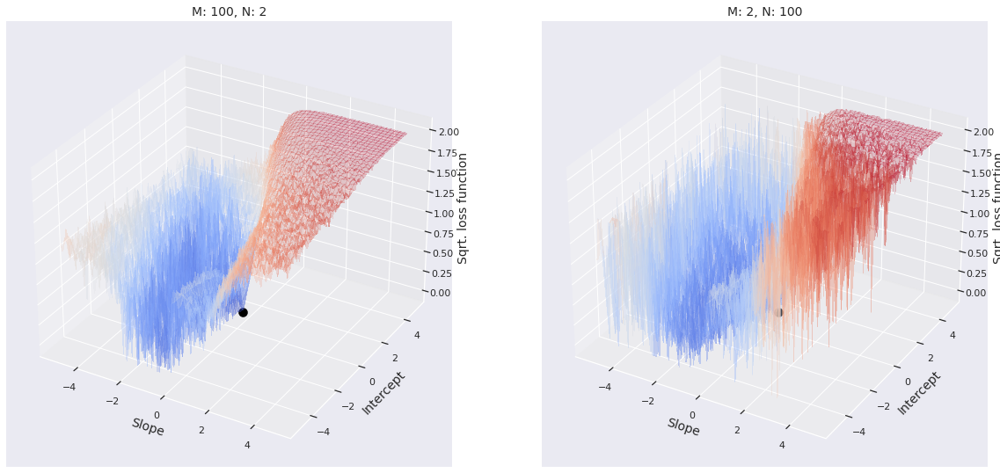

In [72]:
#I. AIO
# Set test model to true value
model_test = NeuralNetwork().to(device)
set_initial_values(model_test, 0.0, torch.logit(torch.tensor([params.true_cst])))
#for name, param in model_MC.named_parameters():
#    print(name, param)
rep = 100
ll = torch.zeros(rep)
for i in range(0,100):
    with torch.no_grad():
        ll[i] = Ξ_torch(model_test, params)
print(torch.var(ll))
print(torch.mean(ll))

for name, param in model_test.named_parameters():
    print(name, param)
    
# Make data.
min_val_x= -5.0
max_val_x= 5.0
min_val_y= -5.0
max_val_y= 5.0

delta_grid=0.1
x_grid = np.arange(min_val_x, max_val_x, delta_grid)
y_grid = np.arange(min_val_y, max_val_y, delta_grid)
X_grid, Y_grid = np.meshgrid(x_grid, y_grid)
Z_AIO = np.zeros((len(x_grid), len(y_grid)))

for (y_index, y_value) in enumerate(y_grid):
    for (x_index, x_value) in enumerate(x_grid):
        set_initial_values(model_test, x_value, y_value)
        #for name, param in model_MC.named_parameters():
        #    print(name, param)
        with torch.no_grad():
            ll = Ξ_torch(model_test, params)
        Z_AIO[y_index, x_index] = ll.detach().numpy()

# II.MC
# Set test model to true value
model_test = NeuralNetwork().to(device)
set_initial_values(model_test, 0.0, torch.logit(torch.tensor([params.true_cst])))
#for name, param in model_MC.named_parameters():
#    print(name, param)
rep = 100
ll = torch.zeros(rep)
for i in range(0,100):
    with torch.no_grad():
        ll[i] = Ξ_torch_MC(model_test, params)
print(torch.var(ll))
print(torch.mean(ll))

for name, param in model_test.named_parameters():
    print(name, param)
    
# Make data.
min_val_x= -5.0
max_val_x= 5.0
min_val_y= -5.0
max_val_y= 5.0

delta_grid=0.1
x_grid = np.arange(min_val_x, max_val_x, delta_grid)
y_grid = np.arange(min_val_y, max_val_y, delta_grid)
X_grid, Y_grid = np.meshgrid(x_grid, y_grid)
Z_MC = np.zeros((len(x_grid), len(y_grid)))

for (y_index, y_value) in enumerate(y_grid):
    for (x_index, x_value) in enumerate(x_grid):
        set_initial_values(model_test, x_value, y_value)
        #for name, param in model_MC.named_parameters():
        #    print(name, param)
        with torch.no_grad():
            ll = Ξ_torch_MC(model_test, params)
        Z_MC[y_index, x_index] = ll.detach().numpy()

        
# Combine surface plots
fig, (ax1, ax2) = plt.subplots(1, 2, subplot_kw={"projection": "3d"})

# Plot the surface.
surf = ax1.plot_surface(X_grid, Y_grid, np.real(np.sqrt(Z_AIO, dtype=np.complex)), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)

# Sometimes negative values. np.sqrt does not like it. It take the real part of the imaginary number.
surf = ax2.plot_surface(X_grid, Y_grid, np.real(np.sqrt(Z_MC, dtype=np.complex)), cmap=cm.coolwarm, linewidth=0, antialiased=False, alpha=0.2)


ax1.scatter([0.0], [torch.logit(torch.tensor([params.true_cst])).numpy()], [0.0], s=100, c='black', linewidth=0.5)
ax1.set_xlabel('Slope', fontsize=MEDIUM_SIZE)
ax1.set_ylabel('Intercept', fontsize=MEDIUM_SIZE)
ax1.zaxis.set_rotate_label(False) 
ax1.set_zlabel('Sqrt. loss function', fontsize=MEDIUM_SIZE, rotation=90)
ax1.set_title('M: {}, N: {}'.format(params.T, 2), size=MEDIUM_SIZE)

ax2.scatter([0.0], [torch.logit(torch.tensor([params.true_cst])).numpy()], [0.0], s=100, c='black', linewidth=0.5)
ax2.set_xlabel('Slope', fontsize=MEDIUM_SIZE)
ax2.set_ylabel('Intercept', fontsize=MEDIUM_SIZE)
ax2.zaxis.set_rotate_label(False) 
ax2.set_zlabel('Sqrt. loss function', fontsize=MEDIUM_SIZE, rotation=90)
ax2.set_title('M: {}, N: {}'.format(params.M, params.N), size=MEDIUM_SIZE)

#plt.suptitle("Loss function and absol".format(params.σ_e), fontsize=14)
figname = output_folder + 'surface_plot_AIO_and_MC_M_{}_σ_e_{}.png'.format(params.M, params.σ_e)
plt.savefig(figname)
plt.show()


In [73]:
df_MC, df_MC_average = calculate_several_runs(params, nb_rep, 
                                              freq_loss = freq_loss_chosen,
                                             initial_guess = initial_guess)
# Create copies
df_MC_high_uncertainty = df_MC.copy()
df_MC_average_high_uncertainty = df_MC_average.copy() 

Training model : 0 / 50
loss: 2.839923 [    0/ 1000]
Training model : 1 / 50
loss: 3.178862 [    0/ 1000]
Training model : 2 / 50
loss: 3.803940 [    0/ 1000]
Training model : 3 / 50
loss: 3.813873 [    0/ 1000]
Training model : 4 / 50
loss: 3.993610 [    0/ 1000]
Training model : 5 / 50
loss: 3.962553 [    0/ 1000]
Training model : 6 / 50
loss: 3.195742 [    0/ 1000]
Training model : 7 / 50
loss: 2.683650 [    0/ 1000]
Training model : 8 / 50
loss: 3.798045 [    0/ 1000]
Training model : 9 / 50
loss: 3.880228 [    0/ 1000]
Training model : 10 / 50
loss: 3.807910 [    0/ 1000]
Training model : 11 / 50
loss: 2.800432 [    0/ 1000]
Training model : 12 / 50
loss: 2.793888 [    0/ 1000]
Training model : 13 / 50
loss: 2.870326 [    0/ 1000]
Training model : 14 / 50
loss: 3.389248 [    0/ 1000]
Training model : 15 / 50
loss: 3.828530 [    0/ 1000]
Training model : 16 / 50
loss: 3.978878 [    0/ 1000]
Training model : 17 / 50
loss: 3.092892 [    0/ 1000]
Training model : 18 / 50
loss: 3.81950

In [74]:
if save_to_csv == True:
    print("Saving to CSV")
    # Save to .csv
    df_MC_high_uncertainty.to_csv(output_folder + 'df_MC_σ_e' + str(params.σ_e) + '.csv', index=False)
    df_MC_average_high_uncertainty.to_csv(output_folder + 'df_MC_average_σ_e' + str(params.σ_e) + '.csv', index=False)
    df_AIO_high_uncertainty.to_csv(output_folder + 'df_AIO_σ_e' + str(params.σ_e) + '.csv', index=False)
    df_AIO_average_high_uncertainty.to_csv(output_folder + 'df_AIO_average_σ_e' + str(params.σ_e) + '.csv', index=False)
if read_from_csv == True:
    print("Reading from CSV")
    # Read from .csv
    df_MC = pd.read_csv(output_folder + 'df_MC_σ_e' + str(params.σ_e) + '.csv')
    df_MC_average = pd.read_csv(output_folder + 'df_MC_average_σ_e' + str(params.σ_e) + '.csv')
    df_AIO = pd.read_csv(output_folder + 'df_AIO_σ_e' + str(params.σ_e) + '.csv')
    df_AIO_average = pd.read_csv(output_folder + 'df_AIO_average_σ_e' + str(params.σ_e) + '.csv')

Saving to CSV


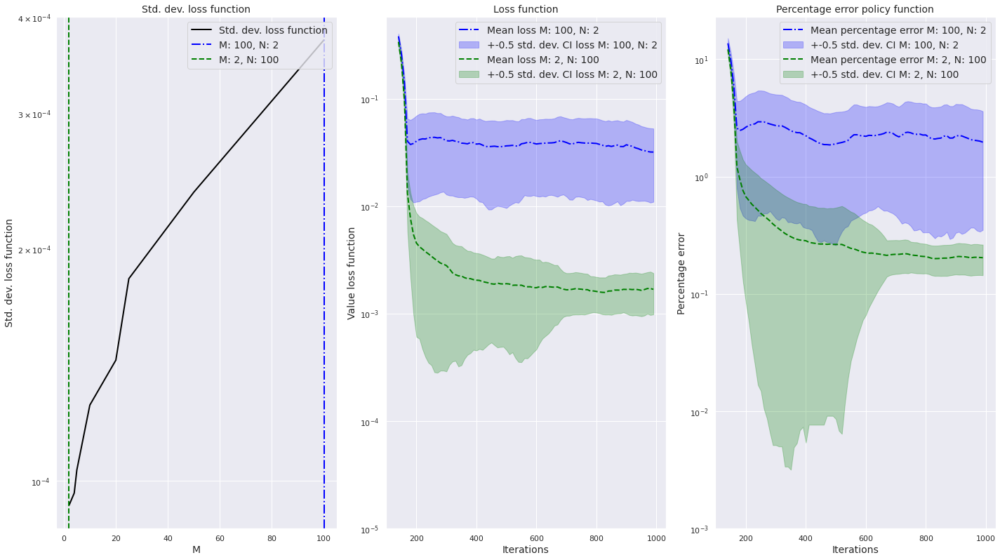

In [75]:
## Plot with trailing std
# Use one standard deviation band
rate_P50 = 15
rate = rate_P50
mult_std = 0.5
min_val = 1e-12

plot_scale = 1.25
plt.rcParams["figure.figsize"] = (plot_scale*16, plot_scale*9)
plt.rcParams['legend.fontsize'] = MEDIUM_SIZE

fig, (ax1, ax2, ax3) = plt.subplots(1, 3)

# Loss AIO
linestyle_AIO = "-."
linestyle_MC = "--"
color_AIO = "blue"
color_MC = "green"

M_AIO = int(df_AIO_average['M'].values[0])
N_AIO = int(df_AIO_average['N'].values[0])

M_MC = int(df_MC_average['M'].values[0])
N_MC = int(df_MC_average['N'].values[0])

# Std. dev. loss
ax1.plot(df_variance_loss_median['M'], df_variance_loss_median['P50_std_loss'], label="Std. dev. loss function", color="black", linewidth=linewidth_chosen)
#ax1.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 variance loss", alpha=0.25)
ax1.axvline([params.T], label="M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO, linewidth=linewidth_chosen)
ax1.axvline([2], label="M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC, linewidth=linewidth_chosen)
ax1.set_xlabel("M",size=MEDIUM_SIZE)
ax1.set_ylabel("Std. dev. loss function",size=MEDIUM_SIZE)
ax1.set_title('Std. dev. loss function',size=MEDIUM_SIZE)
ax1.legend(loc='upper right')

# Loss AIO
std_series = df_AIO_average['std_loss']
ax2.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['loss']).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO, linewidth=linewidth_chosen)
ax2.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Loss Monte Carlo
std_series = df_MC_average['std_loss']
ax2.plot(df_MC_average['iter'], pd.Series(df_MC_average['loss']).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC, linewidth=linewidth_chosen)
ax2.fill_between(df_MC_average['iter'],  pd.Series(np.maximum(df_MC_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)
ax2.set_title('Loss function',size=MEDIUM_SIZE)
ax2.set_xlabel("Iterations",size=MEDIUM_SIZE)
ax2.set_ylabel("Value loss function",size=MEDIUM_SIZE)
ax2.legend()


# Error AIO
#rate_P50 = 10
#rate = 10
mult_std = 0.5
#min_val = 1e-12

std_series = df_AIO_average['std_med_percentage_error']
ax3.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['med_percentage_error']).rolling(rate_P50).mean(), label="Mean percentage error M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO, linewidth=linewidth_chosen)
ax3.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['med_percentage_error'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['med_percentage_error'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Error MC
std_series = df_MC_average['std_med_percentage_error']
ax3.plot(df_MC_average['iter'], pd.Series(df_MC_average['med_percentage_error']).rolling(rate_P50).mean(), label="Mean percentage error M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC, linewidth=linewidth_chosen)
ax3.fill_between(df_MC_average['iter'], pd.Series(np.maximum(df_MC_average['med_percentage_error'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['med_percentage_error'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)

ax3.set_xlabel("Iterations",size=MEDIUM_SIZE)
ax3.set_ylabel("Percentage error",size=MEDIUM_SIZE)
ax3.set_title('Percentage error policy function',size=MEDIUM_SIZE)
ax3.legend()

ax1.set_yscale('log')
#ax2.set_xscale('log')
ax2.set_yscale('log')
#ax3.set_xscale('log')
ax3.set_yscale('log')

# Set axis limits
ax2.set_ylim(1.e-5, )
ax3.set_ylim(1e-3, )

fig.tight_layout()

figname = output_folder + 'AIO_versus_MC_several_runs_3_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname, dpi=150)

plt.show()

In [76]:
rate_P50 = 10
rate = 10
mult_std = 1.0
min_val = 1e-12

last_loss_AIO = pd.Series(df_AIO_average['loss']).rolling(rate).mean().values[-1]
last_loss_MC = pd.Series(df_MC_average['loss']).rolling(rate).mean().values[-1]

print("------------------")
print("Comparing levels")
print("Final loss AIO: {}".format(last_loss_AIO))
print("Final loss MC: {}".format(last_loss_MC))
print("% difference: {}".format(100*(last_loss_AIO/last_loss_MC - 1.0)))

last_loss_AIO = pd.Series(df_AIO_average['med_percentage_error']).rolling(rate).mean().values[-1]
last_loss_MC = pd.Series(df_MC_average['med_percentage_error']).rolling(rate).mean().values[-1]

print("Med % error AIO: {}".format(last_loss_AIO))
print("Med % error MC: {}".format(last_loss_MC))
print("% difference: {}".format(100*(last_loss_AIO/last_loss_MC - 1.0)))

print("------------------")
print("Comparing std deviations")
last_loss_AIO = df_AIO_average['std_loss'].values[-1]
last_loss_MC = df_MC_average['std_loss'].values[-1]

print("Final std dev. loss AIO: {}".format(last_loss_AIO))
print("Final std dev.  loss MC: {}".format(last_loss_MC))
print("% difference: {}".format(100*(last_loss_AIO/last_loss_MC - 1.0)))

last_loss_AIO = df_AIO_average['med_percentage_error'].values[-1]
last_loss_MC = df_MC_average['med_percentage_error'].values[-1]

print("Final std dev. euler error AIO: {}".format(last_loss_AIO))
print("Final std dev. euler error MC: {}".format(last_loss_MC))
print("% difference: {}".format(100*(last_loss_AIO/last_loss_MC - 1.0)))

------------------
Comparing levels
Final loss AIO: 0.02852495266032583
Final loss MC: 0.0016823074704538973
% difference: 1595.5849725038445
Med % error AIO: 1.6191270053386688
Med % error MC: 0.20159348994493484
% difference: 703.164331239532
------------------
Comparing std deviations
Final std dev. loss AIO: 0.04160054568011071
Final std dev.  loss MC: 0.0011214935125057669
% difference: 3609.387991657847
Final std dev. euler error AIO: 1.8664120435714722
Final std dev. euler error MC: 0.18873479962348938
% difference: 888.9072418212891


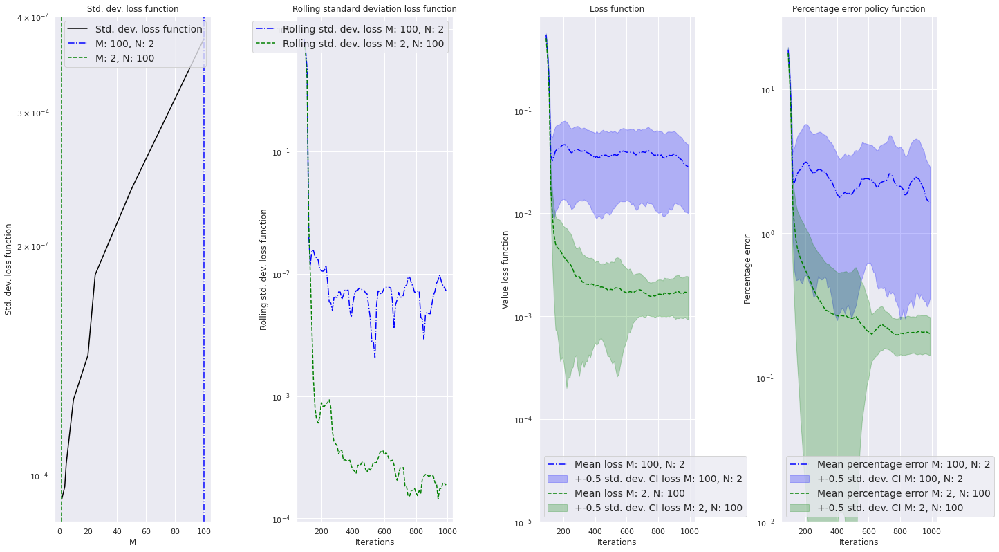

In [77]:
## Plot with trailing std
# Use one standard deviation band
rate_P50 = 10
rate = 10
mult_std = 0.5
min_val = 1e-12

fig, (ax1, ax1_bis, ax2, ax3) = plt.subplots(1, 4)

# Loss AIO
linestyle_AIO = "-."
linestyle_MC = "--"
color_AIO = "blue"
color_MC = "green"

M_AIO = int(df_AIO_average['M'].values[0])
N_AIO = int(df_AIO_average['N'].values[0])

M_MC = int(df_MC_average['M'].values[0])
N_MC = int(df_MC_average['N'].values[0])

# Std. dev. loss
ax1.plot(df_variance_loss_median['M'], df_variance_loss_median['P50_std_loss'], label="Std. dev. loss function", color="black")
#ax1.fill_between(df_variance_loss_median['M'], np.log10(df_variance_loss_median['P25_var_loss']), np.log10(df_variance_loss_median['P75_var_loss']), label="P25-P75 variance loss", alpha=0.25)
ax1.axvline([params.T], label="M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO)
ax1.axvline([2], label="M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC)
ax1.set_xlabel("M")
ax1.set_ylabel("Std. dev. loss function")
ax1.set_title('Std. dev. loss function')
ax1.legend(loc='upper right')

# Trailing std. dev
ax1_bis.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['loss']).rolling(rate_rolling_stddev).std(), label="Rolling std. dev. loss M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO)
#ax1_bis.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Loss Monte Carlo
ax1_bis.plot(df_MC_average['iter'], pd.Series(df_MC_average['loss']).rolling(rate_rolling_stddev).std(), label="Rolling std. dev. loss M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC)
#ax1_bis.fill_between(df_MC_average['iter'],  pd.Series(np.maximum(df_MC_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)
ax1_bis.set_title('Rolling standard deviation loss function')
ax1_bis.set_xlabel("Iterations")
ax1_bis.set_ylabel("Rolling std. dev. loss function")
ax1_bis.legend()

# Loss AIO
std_series = df_AIO_average['std_loss']
ax2.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['loss']).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO)
ax2.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Loss Monte Carlo
std_series = df_MC_average['std_loss']
ax2.plot(df_MC_average['iter'], pd.Series(df_MC_average['loss']).rolling(rate).mean(), label="Mean loss M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC)
ax2.fill_between(df_MC_average['iter'],  pd.Series(np.maximum(df_MC_average['loss'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['loss'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI loss M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)
ax2.set_title('Loss function')
ax2.set_xlabel("Iterations")
ax2.set_ylabel("Value loss function")
ax2.legend()


# Error AIO
#rate_P50 = 10
#rate = 10
mult_std = 0.5
#min_val = 1e-12

std_series = df_AIO_average['std_med_percentage_error']
ax3.plot(df_AIO_average['iter'], pd.Series(df_AIO_average['med_percentage_error']).rolling(rate_P50).mean(), label="Mean percentage error M: {}, N: {}".format(M_AIO, N_AIO), linestyle=linestyle_AIO, color=color_AIO)
ax3.fill_between(df_AIO_average['iter'],  pd.Series(np.maximum(df_AIO_average['med_percentage_error'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_AIO_average['med_percentage_error'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI M: {}, N: {}".format(mult_std, M_AIO, N_AIO), alpha=0.25, color=color_AIO)
# Error MC
std_series = df_MC_average['std_med_percentage_error']
ax3.plot(df_MC_average['iter'], pd.Series(df_MC_average['med_percentage_error']).rolling(rate_P50).mean(), label="Mean percentage error M: {}, N: {}".format(M_MC, N_MC), linestyle=linestyle_MC, color=color_MC)
ax3.fill_between(df_MC_average['iter'], pd.Series(np.maximum(df_MC_average['med_percentage_error'] - mult_std*std_series, min_val)).rolling(rate).mean(), pd.Series(df_MC_average['med_percentage_error'] + mult_std*std_series).rolling(rate).mean(), label="+-{} std. dev. CI M: {}, N: {}".format(mult_std, M_MC, N_MC), alpha=0.25, color=color_MC)

ax3.set_xlabel("Iterations")
ax3.set_ylabel("Percentage error")
ax3.set_title('Percentage error policy function')
ax3.legend()

ax1.set_yscale('log')
ax1_bis.set_yscale('log')
#ax2.set_xscale('log')
ax2.set_yscale('log')
#ax3.set_xscale('log')
ax3.set_yscale('log')

# Set axis limits
ax2.set_ylim(1.e-5, )
ax3.set_ylim(1e-2, )

fig.tight_layout()

figname = output_folder + 'AIO_versus_MC_several_runs_3_trailing_σ_e' + str(params.σ_e) + '.png'
plt.savefig(figname)
plt.show()

---

## Extra visualizations

### Visualize convergence

Visualize convergence of parameters across several runs.

In [78]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import imageio  # for creating gif
import os
from IPython.display import Image #display gif in notebook
import matplotlib.lines as mlines

In [79]:
set_xy_lim = True #True
use_symlog = True #~log scale. But allows for negative values. see: https://matplotlib.org/3.1.0/gallery/scales/symlog_demo.html
color_AIO = "blue"
color_MC = "green"

# Limits
min_val_x = -10.0
max_val_x= -min_val_x
min_val_y= min_val_x
max_val_y= max_val_x

for use_kde in [True, False]: #use kernel or plot points
    for (σ_e, linthresh_chosen) in zip([0.5, 1.5], [1e-6, 1e-2]): #loop over two values for sigma e
        print(f"Create gif with σ_e: {σ_e}")
        # Read .csv filess
        df_AIO = pd.read_csv(output_folder + 'df_AIO_σ_e' + str(σ_e) + '.csv')
        print(df_AIO.head())

        df_MC = pd.read_csv(output_folder + 'df_MC_σ_e' + str(σ_e) + '.csv')
        print(df_MC.head())

        # Calculate percentage deviation from true value
        df_MC["per_dev_slope"] = df_MC["slope"].apply(lambda x: float(x - params.true_weight))
        df_MC["per_dev_intercept"] = df_MC["intercept"].apply(lambda x: float(x - params.true_bias))

        df_AIO["per_dev_slope"] = df_AIO["slope"].apply(lambda x: float(x - params.true_weight))
        df_AIO["per_dev_intercept"] = df_AIO["intercept"].apply(lambda x: float(x - params.true_bias))

        # rename
        df = df_AIO

        # Find unique iterations and repetitions
        iterations = df['iter'].unique()
        repetitions = df['repetition'].unique()

        # Define colors 
        colors = sns.color_palette("Set2", len(repetitions))

        # Prepare directory to save images
        if not os.path.exists('images'):
            os.makedirs('images')

        # Create a plot for each iteration
        for i, iteration in enumerate(iterations):
            plt.figure(figsize=(10, 6))

            # Plot each repetition for the current iteration
            if use_kde == False:
                for repetition in repetitions:
                    temp_df = df[(df['repetition'] == repetition) & (df['iter'] == iteration)]
                    #temp_df = temp_df.drop_duplicates(subset='iter')
                    temp_df_2 = df_MC[(df_MC['repetition'] == repetition) & (df_MC['iter'] == iteration)]
                    #temp_df_2 = temp_df_2.drop_duplicates(subset='iter')
                    if repetition == len(repetitions)-1: #set label
                        plt.scatter(temp_df['per_dev_intercept'], temp_df['per_dev_slope'], color=color_AIO, s=100, alpha=0.5, edgecolors='w', label="bc-MC. M: 100, N: 2")
                        plt.scatter(temp_df_2['per_dev_intercept'], temp_df_2['per_dev_slope'], color=color_MC, s=100, alpha=0.5, edgecolors='w', marker="s", label="bc-MC. M: 2, N: 100")
                    else:
                        plt.scatter(temp_df['per_dev_intercept'], temp_df['per_dev_slope'], color=color_AIO, s=100, alpha=0.5, edgecolors='w')
                        plt.scatter(temp_df_2['per_dev_intercept'], temp_df_2['per_dev_slope'], color=color_MC, s=100, alpha=0.5, edgecolors='w', marker="s")

            else:
                handles = []
                temp_df = df[df['iter'] == iteration]
                temp_df_2 = df_MC[df_MC['iter'] == iteration]
                sns.kdeplot(x=temp_df['per_dev_intercept'], y=temp_df['per_dev_slope'], color=color_AIO, fill=True, alpha=0.5, label="bc-MC. M: 100, N: 2")
                handles.append(mlines.Line2D([], [], color=color_AIO, label="bc-MC. M: 100, N: 2"))
                sns.kdeplot(x=temp_df_2['per_dev_intercept'], y=temp_df_2['per_dev_slope'], color=color_MC, fill=True, alpha=0.5, label="bc-MC. M: 2, N: 100")
                handles.append(mlines.Line2D([], [], color=color_MC, label="bc-MC. M: 2, N: 100"))
            if set_xy_lim==True:
                plt.xlim((min_val_x, max_val_x))
                plt.ylim((min_val_y, max_val_y))
            if use_symlog==True:
                plt.xscale('symlog', linthresh=linthresh_chosen)
                plt.yscale('symlog', linthresh=linthresh_chosen)
                plt.grid(True)
            plt.xlabel('% Dev. Intercept, symlog')
            plt.ylabel('% Dev. Slope, symlog')
            plt.title(f'Iteration: {iteration}. σ_e: {σ_e}')
            plt.legend(loc='upper right', handles = handles)

            plt.savefig(f'images/plot_{i}.png')
            plt.close()

        # Create gif from images
        with imageio.get_writer(f'neogrowth_σ_e_{σ_e}_{use_kde}.gif', mode='I') as writer:
            for i in range(len(iterations)):
                image = imageio.imread(f'images/plot_{i}.png')
                writer.append_data(image)

        # If you want to remove all image files
        for i in range(len(iterations)):
            os.remove(f'images/plot_{i}.png')

Create gif with σ_e: 0.5
     M  N  repetition  iter      loss  med_percentage_error  intercept   
0  100  2           0     0  1.896245             61.945198   2.000000  \
1  100  2           0    10  1.824374             61.258713   1.662891   
2  100  2           0    20  1.560308             53.180520   1.093160   
3  100  2           0    30  0.053415              2.961690   0.643077   
4  100  2           0    40  0.051689              2.107174   0.613674   

      slope  abs_perc_dev_bias  abs_perc_dev_weight  
0  2.000000         323.186920           200.000000  
1  1.692617         251.856950           169.261670  
2  1.015311         131.305500           101.531065  
3 -0.045895          36.070915             4.589463  
4 -0.038445          29.849342             3.844458  
   M    N  repetition  iter      loss  med_percentage_error  intercept   
0  2  100           0     0  1.804278             61.920315   2.000000  \
1  2  100           0    10  1.943334             61.57154

/tmp/ipykernel_922136/1832317781.py:65: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x=temp_df['per_dev_intercept'], y=temp_df['per_dev_slope'], color=color_AIO, fill=True, alpha=0.5, label="bc-MC. M: 100, N: 2")
/tmp/ipykernel_922136/1832317781.py:67: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x=temp_df_2['per_dev_intercept'], y=temp_df_2['per_dev_slope'], color=color_MC, fill=True, alpha=0.5, label="bc-MC. M: 2, N: 100")


Create gif with σ_e: 1.5
     M  N  repetition  iter      loss  med_percentage_error  intercept   
0  100  2           0     0  1.891839             61.945107   2.000000  \
1  100  2           0    10  1.807695             61.146103   1.622826   
2  100  2           0    20  1.461410             47.446255   1.005403   
3  100  2           0    30  0.073242              4.188062   0.588279   
4  100  2           0    40  0.019044              2.877112   0.520778   

      slope  abs_perc_dev_bias  abs_perc_dev_weight  
0  2.000000         323.186920           200.000000  
1  1.675028         243.379400           167.502832  
2  0.849015         112.736786            84.901530  
3 -0.001940          24.475943             0.194013  
4  0.004098          10.193233             0.409763  
   M    N  repetition  iter      loss  med_percentage_error  intercept   
0  2  100           0     0  1.685207             61.903460   2.000000  \
1  2  100           0    10  1.732754             60.88723

/tmp/ipykernel_922136/1832317781.py:65: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x=temp_df['per_dev_intercept'], y=temp_df['per_dev_slope'], color=color_AIO, fill=True, alpha=0.5, label="bc-MC. M: 100, N: 2")
/tmp/ipykernel_922136/1832317781.py:67: UserWarning: KDE cannot be estimated (0 variance or perfect covariance). Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x=temp_df_2['per_dev_intercept'], y=temp_df_2['per_dev_slope'], color=color_MC, fill=True, alpha=0.5, label="bc-MC. M: 2, N: 100")


Create gif with σ_e: 0.5
     M  N  repetition  iter      loss  med_percentage_error  intercept   
0  100  2           0     0  1.896245             61.945198   2.000000  \
1  100  2           0    10  1.824374             61.258713   1.662891   
2  100  2           0    20  1.560308             53.180520   1.093160   
3  100  2           0    30  0.053415              2.961690   0.643077   
4  100  2           0    40  0.051689              2.107174   0.613674   

      slope  abs_perc_dev_bias  abs_perc_dev_weight  
0  2.000000         323.186920           200.000000  
1  1.692617         251.856950           169.261670  
2  1.015311         131.305500           101.531065  
3 -0.045895          36.070915             4.589463  
4 -0.038445          29.849342             3.844458  
   M    N  repetition  iter      loss  med_percentage_error  intercept   
0  2  100           0     0  1.804278             61.920315   2.000000  \
1  2  100           0    10  1.943334             61.57154

#### Low uncertainty


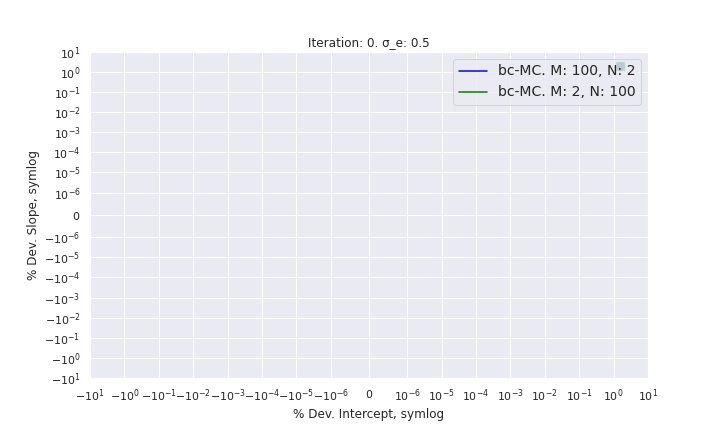

In [80]:
# Use the filename of your gif in the Image call
Image(filename=f"neogrowth_σ_e_0.5_False.gif")

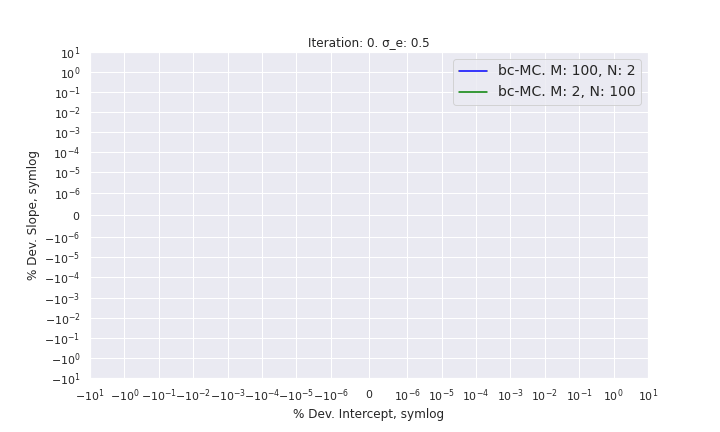

In [81]:
# Use the filename of your gif in the Image call
Image(filename=f"neogrowth_σ_e_0.5_True.gif")

#### High uncertainty


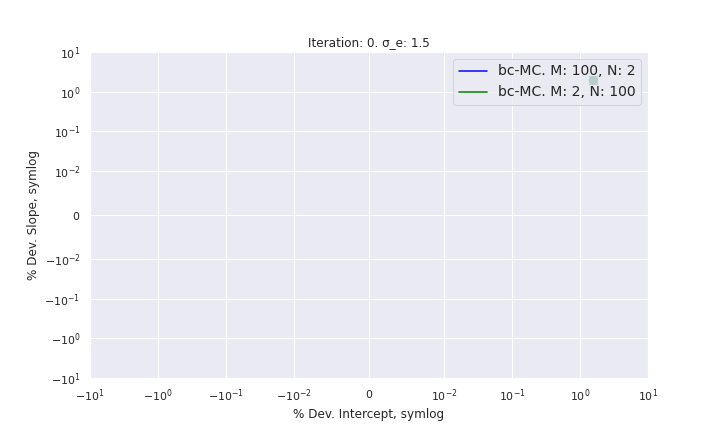

In [82]:
# Use the filename of your gif in the Image call
Image(filename=f"neogrowth_σ_e_1.5_False.gif")

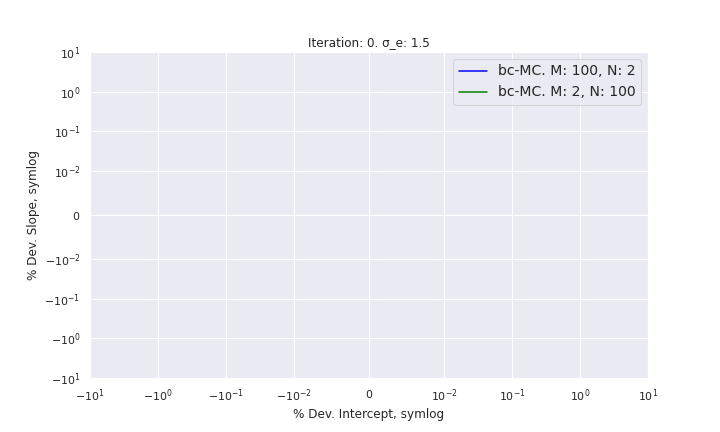

In [83]:
# Use the filename of your gif in the Image call
Image(filename=f"neogrowth_σ_e_1.5_True.gif")